#  StratifiedKFold is used to ensure that each fold maintains the same ratio of target classes.A helper function multilabel_stratified_kfold is defined to handle the multilabel target by converting the multilabel targets into single labels for stratification.The features (X) and target (y) are converted into numpy arrays for compatibility with Keras.The features are reshaped to be suitable for LSTM input, as LSTM expects input of shape (samples, time steps, features). 

In [60]:
import pandas as pd
import numpy as np
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import StratifiedKFold
from tensorflow.keras.preprocessing.sequence import pad_sequences
from tensorflow.keras.utils import to_categorical
from tensorflow.keras.models import Sequential, Model
from tensorflow.keras.layers import Dense, LSTM, Dropout, Input

# Load your dataset
data = pd.read_csv("B:/Projects/PycharmProjects/PPMI_Research_on_Parkinson's/src/mahbub/finalDatasetWithUPDRSScore.csv")

# Define non-feature, numerical, and categorical columns
non_feature_columns = ['Patient ID', 'Visit Date', 'UPDRS_SCORE', 'Visit']
numerical_features = [
    'Area', 'Circularity', 'ConvexArea', 'EquivDiameter', 'Extent',
    'FilledArea', 'Kurtosis', 'Major axis length', 'Mean',
    'Minor axis length', 'PA_ratio', 'Shannon_Entropy', 'Skewness',
    'Solidity', 'Standard Deviation', 'brightness', 'contrast',
    'correlation', 'dissimilarity', 'energy', 'gabor_energy',
    'gabor_entropy', 'homogeneity', 'lbp_energy', 'lbp_entropy',
    'DATSCAN_CAUDATE_R', 'DATSCAN_CAUDATE_L', 'DATSCAN_PUTAMEN_R',
    'DATSCAN_PUTAMEN_L', 'DATSCAN_PUTAMEN_R_ANT', 'DATSCAN_PUTAMEN_L_ANT'
]
categorical_features = [
        'NP1ANXS', 'NP1APAT', 'NP1COG', 'NP1DDS', 'NP1DPRS',
       'NP1HALL', 'NP1CNST', 'NP1FATG', 'NP1LTHD', 'NP1PAIN', 'NP1SLPD',
       'NP1SLPN', 'NP1URIN', 'NP2DRES', 'NP2EAT', 'NP2FREZ', 'NP2HOBB',
       'NP2HWRT', 'NP2HYGN', 'NP2RISE', 'NP2SALV', 'NP2SPCH', 'NP2SWAL',
       'NP2TRMR', 'NP2TURN', 'NP2WALK', 'NP3BRADY', 'NP3FACXP', 'NP3FRZGT',
       'NP3FTAPL', 'NP3FTAPR', 'NP3GAIT', 'NP3HMOVL', 'NP3HMOVR', 'NP3KTRML',
       'NP3KTRMR', 'NP3LGAGL', 'NP3LGAGR', 'NP3POSTR', 'NP3PRSPL', 'NP3PRSPR',
       'NP3PSTBL', 'NP3PTRML', 'NP3PTRMR', 'NP3RIGLL', 'NP3RIGLU', 'NP3RIGN',
       'NP3RIGRL', 'NP3RIGRU', 'NP3RISNG', 'NP3RTALJ', 'NP3RTALL', 'NP3RTALU',
       'NP3RTARL', 'NP3RTARU', 'NP3RTCON', 'NP3SPCH', 'NP3TTAPL', 'NP3TTAPR',
       'NHY'
]
target_column = "Disease_Severity"

# Scale numerical features
scaler = StandardScaler()
data[numerical_features] = scaler.fit_transform(data[numerical_features])

# One-hot encode the target variable (Disease_Severity)
data = pd.get_dummies(data, columns=[target_column], drop_first=False)

# Extract target columns after one-hot encoding
target_columns = list(data.filter(regex='Disease_Severity').columns)

# Separate features and target
X = data.drop(non_feature_columns + target_columns, axis=1)
y = data[target_columns]

# Convert X and y to numpy arrays
X = X.values
y = y.values

# Function to create LSTM model
def create_lstm_model(input_shape, output_shape):
    inputs = Input(shape=input_shape)
    x = LSTM(50)(inputs)
    x = Dropout(0.2)(x)
    outputs = Dense(output_shape, activation='softmax')(x)
    model = Model(inputs, outputs)
    model.compile(optimizer='adam', loss='categorical_crossentropy', metrics=['accuracy'])
    return model

# Create StratifiedKFold cross-validation object
n_splits = 7
skf = StratifiedKFold(n_splits=n_splits, shuffle=True, random_state=42)

# Initialize lists to store results
fold_train_losses = []
fold_train_accuracies = []
fold_test_losses = []
fold_test_accuracies = []

# Helper function to stratify by multilabel target
def multilabel_stratified_kfold(X, y, skf):
    # Convert multilabel to single label by joining class indices as strings
    stratify_labels = np.array([''.join(str(int(class_)) for class_ in row) for row in y])
    for train_idx, test_idx in skf.split(X, stratify_labels):
        yield train_idx, test_idx

# Perform StratifiedKFold cross-validation
for fold_index, (train_index, test_index) in enumerate(multilabel_stratified_kfold(X, y, skf)):
    print(f"Fold {fold_index + 1}/{n_splits}")
    
    # Split data into training and testing sets for this fold
    X_train, X_test = X[train_index], X[test_index]
    y_train, y_test = y[train_index], y[test_index]
    
    # Reshape X for LSTM input (samples, time steps, features)
    X_train = X_train.reshape((X_train.shape[0], 1, X_train.shape[1]))
    X_test = X_test.reshape((X_test.shape[0], 1, X_test.shape[1]))
    
    # Create and train LSTM model
    lstm_model = create_lstm_model((X_train.shape[1], X_train.shape[2]), y_train.shape[1])
    lstm_history = lstm_model.fit(X_train, y_train, epochs=100, batch_size=32, verbose=1)
    
    # Evaluate model on training set
    train_loss, train_accuracy = lstm_model.evaluate(X_train, y_train, verbose=0)
    fold_train_losses.append(train_loss)
    fold_train_accuracies.append(train_accuracy)
    print(f"Train Loss: {train_loss}, Train Accuracy: {train_accuracy}")
    
    # Evaluate model on testing set
    test_loss, test_accuracy = lstm_model.evaluate(X_test, y_test, verbose=0)
    fold_test_losses.append(test_loss)
    fold_test_accuracies.append(test_accuracy)
    print(f"Test Loss: {test_loss}, Test Accuracy: {test_accuracy}")
    print("-" * 30)

# Print average results across all folds
print("Average Results Across Folds:")
print(f"Train Loss: {np.mean(fold_train_losses)}, Train Accuracy: {np.mean(fold_train_accuracies)}")
print(f"Test Loss: {np.mean(fold_test_losses)}, Test Accuracy: {np.mean(fold_test_accuracies)}")


Fold 1/7
Epoch 1/100
25/25 ━━━━━━━━━━━━━━━━━━━━ 2s 998us/step - accuracy: 0.2790 - loss: 1.7255
Epoch 2/100
25/25 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.3937 - loss: 1.4976 
Epoch 3/100
25/25 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.4205 - loss: 1.3981 
Epoch 4/100
25/25 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.4711 - loss: 1.3065 
Epoch 5/100
25/25 ━━━━━━━━━━━━━━━━━━━━ 0s 1000us/step - accuracy: 0.5033 - loss: 1.2764
Epoch 6/100
25/25 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.5338 - loss: 1.2236 
Epoch 7/100
25/25 ━━━━━━━━━━━━━━━━━━━━ 0s 1000us/step - accuracy: 0.5821 - loss: 1.0898
Epoch 8/100
25/25 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.6362 - loss: 1.0484 
Epoch 9/100
25/25 ━━━━━━━━━━━━━━━━━━━━ 0s 962us/step - accuracy: 0.5878 - loss: 1.0311
Epoch 10/100
25/25 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.6543 - loss: 0.9732 
Epoch 11/100
25/25 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.6763 - loss: 0.9227 
Epoch 12/100
25/25 ━━━━━━━━━━━━━━━━━━

# Stratified KFold for Multilabel Data: The multilabel_stratified_kfold function converts the multilabel target into a single string label to use with StratifiedKFold.Reshaping Data for LSTM: The data is reshaped to fit the input requirements of LSTM layers.Model Creation and Training: The model is created and trained within each fold.

In [2]:
import pandas as pd
import numpy as np
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import StratifiedKFold
from tensorflow.keras.models import Model
from tensorflow.keras.layers import Dense, LSTM, Dropout, Input

# Load your dataset
data = pd.read_csv("B:/Projects/PycharmProjects/PPMI_Research_on_Parkinson's/src/mahbub/finalDatasetWithUPDRSScore.csv")

# Define non-feature, numerical, and categorical columns
non_feature_columns = ['Patient ID', 'Visit Date', 'UPDRS_SCORE', 'Visit']
numerical_features = [
    'Area', 'Circularity', 'ConvexArea', 'EquivDiameter', 'Extent',
    'FilledArea', 'Kurtosis', 'Major axis length', 'Mean',
    'Minor axis length', 'PA_ratio', 'Shannon_Entropy', 'Skewness',
    'Solidity', 'Standard Deviation', 'brightness', 'contrast',
    'correlation', 'dissimilarity', 'energy', 'gabor_energy',
    'gabor_entropy', 'homogeneity', 'lbp_energy', 'lbp_entropy',
    'DATSCAN_CAUDATE_R', 'DATSCAN_CAUDATE_L', 'DATSCAN_PUTAMEN_R',
    'DATSCAN_PUTAMEN_L', 'DATSCAN_PUTAMEN_R_ANT', 'DATSCAN_PUTAMEN_L_ANT'
]
categorical_features = [
    'NP1ANXS', 'NP1APAT', 'NP1COG', 'NP1DDS', 'NP1DPRS',
    'NP1HALL', 'NP1CNST', 'NP1FATG', 'NP1LTHD', 'NP1PAIN', 'NP1SLPD',
    'NP1SLPN', 'NP1URIN', 'NP2DRES', 'NP2EAT', 'NP2FREZ', 'NP2HOBB',
    'NP2HWRT', 'NP2HYGN', 'NP2RISE', 'NP2SALV', 'NP2SPCH', 'NP2SWAL',
    'NP2TRMR', 'NP2TURN', 'NP2WALK', 'NP3BRADY', 'NP3FACXP', 'NP3FRZGT',
    'NP3FTAPL', 'NP3FTAPR', 'NP3GAIT', 'NP3HMOVL', 'NP3HMOVR', 'NP3KTRML',
    'NP3KTRMR', 'NP3LGAGL', 'NP3LGAGR', 'NP3POSTR', 'NP3PRSPL', 'NP3PRSPR',
    'NP3PSTBL', 'NP3PTRML', 'NP3PTRMR', 'NP3RIGLL', 'NP3RIGLU', 'NP3RIGN',
    'NP3RIGRL', 'NP3RIGRU', 'NP3RISNG', 'NP3RTALJ', 'NP3RTALL', 'NP3RTALU',
    'NP3RTARL', 'NP3RTARU', 'NP3RTCON', 'NP3SPCH', 'NP3TTAPL', 'NP3TTAPR',
    'NHY'
]
target_column = "Disease_Severity"

# Scale numerical features
scaler = StandardScaler()
data[numerical_features] = scaler.fit_transform(data[numerical_features])

# One-hot encode the target variable (Disease_Severity)
data = pd.get_dummies(data, columns=[target_column], drop_first=False)

# Extract target columns after one-hot encoding
target_columns = list(data.filter(regex='Disease_Severity').columns)

# Separate features and target
X = data.drop(non_feature_columns + target_columns, axis=1)
y = data[target_columns]

# Convert X and y to numpy arrays
X = X.values
y = y.values

# Function to create LSTM model
def create_lstm_model(input_shape, output_shape):
    inputs = Input(shape=input_shape)
    x = LSTM(50)(inputs)
    x = Dropout(0.2)(x)
    outputs = Dense(output_shape, activation='softmax')(x)
    model = Model(inputs, outputs)
    model.compile(optimizer='adam', loss='categorical_crossentropy', metrics=['accuracy'])
    return model

# Create StratifiedKFold cross-validation object
n_splits = 7
skf = StratifiedKFold(n_splits=n_splits, shuffle=True, random_state=42)

# Initialize lists to store results
fold_train_losses = []
fold_train_accuracies = []
fold_test_losses = []
fold_test_accuracies = []

# Helper function to stratify by multilabel target
def multilabel_stratified_kfold(X, y, skf):
    # Convert multilabel to single label by joining class indices as strings
    stratify_labels = np.array([''.join(str(int(class_)) for class_ in row) for row in y])
    for train_idx, test_idx in skf.split(X, stratify_labels):
        yield train_idx, test_idx

# Perform StratifiedKFold cross-validation
for fold_index, (train_index, test_index) in enumerate(multilabel_stratified_kfold(X, y, skf)):
    print(f"Fold {fold_index + 1}/{n_splits}")
    
    # Split data into training and testing sets for this fold
    X_train, X_test = X[train_index], X[test_index]
    y_train, y_test = y[train_index], y[test_index]
    
    # Reshape X for LSTM input (samples, time steps, features)
    X_train = X_train.reshape((X_train.shape[0], 1, X_train.shape[1]))
    X_test = X_test.reshape((X_test.shape[0], 1, X_test.shape[1]))
    
    # Create and train LSTM model
    lstm_model = create_lstm_model((X_train.shape[1], X_train.shape[2]), y_train.shape[1])
    lstm_history = lstm_model.fit(X_train, y_train, epochs=50, batch_size=32, verbose=1)
    
    # Evaluate model on training set
    train_loss, train_accuracy = lstm_model.evaluate(X_train, y_train, verbose=0)
    fold_train_losses.append(train_loss)
    fold_train_accuracies.append(train_accuracy)
    print(f"Train Loss: {train_loss}, Train Accuracy: {train_accuracy}")
    
    # Evaluate model on testing set
    test_loss, test_accuracy = lstm_model.evaluate(X_test, y_test, verbose=0)
    fold_test_losses.append(test_loss)
    fold_test_accuracies.append(test_accuracy)
    print(f"Test Loss: {test_loss}, Test Accuracy: {test_accuracy}")
    print("-" * 30)

# Print average results across all folds
print("Average Results Across Folds:")
print(f"Train Loss: {np.mean(fold_train_losses)}, Train Accuracy: {np.mean(fold_train_accuracies)}")
print(f"Test Loss: {np.mean(fold_test_losses)}, Test Accuracy: {np.mean(fold_test_accuracies)}")


Fold 1/7
Epoch 1/50
25/25 ━━━━━━━━━━━━━━━━━━━━ 1s 879us/step - accuracy: 0.2001 - loss: 1.8038
Epoch 2/50
25/25 ━━━━━━━━━━━━━━━━━━━━ 0s 880us/step - accuracy: 0.4088 - loss: 1.5030
Epoch 3/50
25/25 ━━━━━━━━━━━━━━━━━━━━ 0s 966us/step - accuracy: 0.4615 - loss: 1.3833
Epoch 4/50
25/25 ━━━━━━━━━━━━━━━━━━━━ 0s 880us/step - accuracy: 0.4818 - loss: 1.3135
Epoch 5/50
25/25 ━━━━━━━━━━━━━━━━━━━━ 0s 880us/step - accuracy: 0.4989 - loss: 1.2352
Epoch 6/50
25/25 ━━━━━━━━━━━━━━━━━━━━ 0s 877us/step - accuracy: 0.5467 - loss: 1.1459
Epoch 7/50
25/25 ━━━━━━━━━━━━━━━━━━━━ 0s 958us/step - accuracy: 0.5829 - loss: 1.1064
Epoch 8/50
25/25 ━━━━━━━━━━━━━━━━━━━━ 0s 922us/step - accuracy: 0.6008 - loss: 1.0523
Epoch 9/50
25/25 ━━━━━━━━━━━━━━━━━━━━ 0s 921us/step - accuracy: 0.6608 - loss: 0.9828
Epoch 10/50
25/25 ━━━━━━━━━━━━━━━━━━━━ 0s 880us/step - accuracy: 0.6672 - loss: 0.9500
Epoch 11/50
25/25 ━━━━━━━━━━━━━━━━━━━━ 0s 919us/step - accuracy: 0.6362 - loss: 0.9383
Epoch 12/50
25/25 ━━━━━━━━━━━━━━━━━━━━ 0s 8

# Regularization (l2) to penalize large weights.
# Increased dropout rate to reduce overfitting.
# Early stopping to halt training when performance on the validation set stops improving.

In [5]:
import pandas as pd
import numpy as np
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import StratifiedKFold
from tensorflow.keras.models import Model
from tensorflow.keras.layers import Dense, LSTM, Dropout, Input
from tensorflow.keras.regularizers import l2
from tensorflow.keras.callbacks import EarlyStopping

# Load your dataset
data = pd.read_csv("B:/Projects/PycharmProjects/PPMI_Research_on_Parkinson's/src/mahbub/finalDatasetWithUPDRSScore.csv")

# Define non-feature, numerical, and categorical columns
non_feature_columns = ['Patient ID', 'Visit Date', 'UPDRS_SCORE', 'Visit']
numerical_features = [
    'Area', 'Circularity', 'ConvexArea', 'EquivDiameter', 'Extent',
    'FilledArea', 'Kurtosis', 'Major axis length', 'Mean',
    'Minor axis length', 'PA_ratio', 'Shannon_Entropy', 'Skewness',
    'Solidity', 'Standard Deviation', 'brightness', 'contrast',
    'correlation', 'dissimilarity', 'energy', 'gabor_energy',
    'gabor_entropy', 'homogeneity', 'lbp_energy', 'lbp_entropy',
    'DATSCAN_CAUDATE_R', 'DATSCAN_CAUDATE_L', 'DATSCAN_PUTAMEN_R',
    'DATSCAN_PUTAMEN_L', 'DATSCAN_PUTAMEN_R_ANT', 'DATSCAN_PUTAMEN_L_ANT'
]
categorical_features = [
    'NP1ANXS', 'NP1APAT', 'NP1COG', 'NP1DDS', 'NP1DPRS',
    'NP1HALL', 'NP1CNST', 'NP1FATG', 'NP1LTHD', 'NP1PAIN', 'NP1SLPD',
    'NP1SLPN', 'NP1URIN', 'NP2DRES', 'NP2EAT', 'NP2FREZ', 'NP2HOBB',
    'NP2HWRT', 'NP2HYGN', 'NP2RISE', 'NP2SALV', 'NP2SPCH', 'NP2SWAL',
    'NP2TRMR', 'NP2TURN', 'NP2WALK', 'NP3BRADY', 'NP3FACXP', 'NP3FRZGT',
    'NP3FTAPL', 'NP3FTAPR', 'NP3GAIT', 'NP3HMOVL', 'NP3HMOVR', 'NP3KTRML',
    'NP3KTRMR', 'NP3LGAGL', 'NP3LGAGR', 'NP3POSTR', 'NP3PRSPL', 'NP3PRSPR',
    'NP3PSTBL', 'NP3PTRML', 'NP3PTRMR', 'NP3RIGLL', 'NP3RIGLU', 'NP3RIGN',
    'NP3RIGRL', 'NP3RIGRU', 'NP3RISNG', 'NP3RTALJ', 'NP3RTALL', 'NP3RTALU',
    'NP3RTARL', 'NP3RTARU', 'NP3RTCON', 'NP3SPCH', 'NP3TTAPL', 'NP3TTAPR',
    'NHY'
]
target_column = "Disease_Severity"

# Scale numerical features
scaler = StandardScaler()
data[numerical_features] = scaler.fit_transform(data[numerical_features])

# One-hot encode the target variable (Disease_Severity)
data = pd.get_dummies(data, columns=[target_column], drop_first=False)

# Extract target columns after one-hot encoding
target_columns = list(data.filter(regex='Disease_Severity').columns)

# Separate features and target
X = data.drop(non_feature_columns + target_columns, axis=1)
y = data[target_columns]

# Convert X and y to numpy arrays
X = X.values
y = y.values

# Function to create LSTM model
def create_lstm_model(input_shape, output_shape, units=50, dropout_rate=0.5, l2_rate=0.001):
    inputs = Input(shape=input_shape)
    x = LSTM(units, kernel_regularizer=l2(l2_rate))(inputs)
    x = Dropout(dropout_rate)(x)
    outputs = Dense(output_shape, activation='softmax', kernel_regularizer=l2(l2_rate))(x)
    model = Model(inputs, outputs)
    model.compile(optimizer='adam', loss='categorical_crossentropy', metrics=['accuracy'])
    return model

# Create StratifiedKFold cross-validation object
n_splits = 7
skf = StratifiedKFold(n_splits=n_splits, shuffle=True, random_state=42)

# Initialize lists to store results
fold_train_losses = []
fold_train_accuracies = []
fold_test_losses = []
fold_test_accuracies = []

# Helper function to stratify by multilabel target
def multilabel_stratified_kfold(X, y, skf):
    stratify_labels = np.array([''.join(str(int(class_)) for class_ in row) for row in y])
    for train_idx, test_idx in skf.split(X, stratify_labels):
        yield train_idx, test_idx

# Perform StratifiedKFold cross-validation
for fold_index, (train_index, test_index) in enumerate(multilabel_stratified_kfold(X, y, skf)):
    print(f"Fold {fold_index + 1}/{n_splits}")
    
    # Split data into training and testing sets for this fold
    X_train, X_test = X[train_index], X[test_index]
    y_train, y_test = y[train_index], y[test_index]
    
    # Reshape X for LSTM input (samples, time steps, features)
    X_train = X_train.reshape((X_train.shape[0], 1, X_train.shape[1]))
    X_test = X_test.reshape((X_test.shape[0], 1, X_test.shape[1]))
    
    # Create and train LSTM model
    lstm_model = create_lstm_model((X_train.shape[1], X_train.shape[2]), len(target_columns))
    early_stopping = EarlyStopping(monitor='val_loss', patience=5, restore_best_weights=True)
    lstm_history = lstm_model.fit(X_train, y_train, epochs=50, batch_size=32, verbose=1, validation_split=0.2, callbacks=[early_stopping])
    
    # Evaluate model on training set
    train_loss, train_accuracy = lstm_model.evaluate(X_train, y_train, verbose=0)
    fold_train_losses.append(train_loss)
    fold_train_accuracies.append(train_accuracy)
    print(f"Train Loss: {train_loss}, Train Accuracy: {train_accuracy}")
    
    # Evaluate model on testing set
    test_loss, test_accuracy = lstm_model.evaluate(X_test, y_test, verbose=0)
    fold_test_losses.append(test_loss)
    fold_test_accuracies.append(test_accuracy)
    print(f"Test Loss: {test_loss}, Test Accuracy: {test_accuracy}")
    print("-" * 30)

# Print average results across all folds
print("Average Results Across Folds:")
print(f"Train Loss: {np.mean(fold_train_losses)}, Train Accuracy: {np.mean(fold_train_accuracies)}")
print(f"Test Loss: {np.mean(fold_test_losses)}, Test Accuracy: {np.mean(fold_test_accuracies)}")


Fold 1/7
Epoch 1/50
20/20 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.2277 - loss: 1.9348 - val_accuracy: 0.3121 - val_loss: 1.7300
Epoch 2/50
20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.3404 - loss: 1.7256 - val_accuracy: 0.4395 - val_loss: 1.5778
Epoch 3/50
20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.3579 - loss: 1.6246 - val_accuracy: 0.4777 - val_loss: 1.4894
Epoch 4/50
20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.3975 - loss: 1.5313 - val_accuracy: 0.4904 - val_loss: 1.4254
Epoch 5/50
20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.3878 - loss: 1.5018 - val_accuracy: 0.5032 - val_loss: 1.3807
Epoch 6/50
20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.4360 - loss: 1.4488 - val_accuracy: 0.5096 - val_loss: 1.3355
Epoch 7/50
20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.4531 - loss: 1.4120 - val_accuracy: 0.5159 - val_loss: 1.3032
Epoch 8/50
20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.5069 - loss: 1.3094 - val_accuracy: 0.5414 -

# This code aims to build and tune an LSTM model for predicting disease severity from a dataset. It does the following:

# Data Preparation: Loads and preprocesses the dataset, including scaling numerical data and encoding categorical targets.

# Model Building: Defines an LSTM neural network model using Keras with TensorFlow backend.

# Cross-Validation: Uses stratified K-Fold cross-validation to ensure equal distribution of target classes in training and testing sets across multiple folds.

# Hyperparameter Tuning: Uses GridSearchCV to search for the best combination of hyperparameters for the LSTM model, optimizing its performance.

# Evaluation: Prints out the best hyperparameters and their corresponding performance metrics, helping to choose the best model configuration.

In [9]:
import pandas as pd
import numpy as np
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import StratifiedKFold, GridSearchCV
from tensorflow.keras.models import Model
from tensorflow.keras.layers import Dense, LSTM, Dropout, Input
from tensorflow.keras.regularizers import l2
from tensorflow.keras.callbacks import EarlyStopping
from scikeras.wrappers import KerasClassifier

# Load your dataset
data = pd.read_csv("B:/Projects/PycharmProjects/PPMI_Research_on_Parkinson's/src/mahbub/finalDatasetWithUPDRSScore.csv")

# Define non-feature, numerical, and categorical columns
non_feature_columns = ['Patient ID', 'Visit Date', 'UPDRS_SCORE', 'Visit']
numerical_features = [
    'Area', 'Circularity', 'ConvexArea', 'EquivDiameter', 'Extent',
    'FilledArea', 'Kurtosis', 'Major axis length', 'Mean',
    'Minor axis length', 'PA_ratio', 'Shannon_Entropy', 'Skewness',
    'Solidity', 'Standard Deviation', 'brightness', 'contrast',
    'correlation', 'dissimilarity', 'energy', 'gabor_energy',
    'gabor_entropy', 'homogeneity', 'lbp_energy', 'lbp_entropy',
    'DATSCAN_CAUDATE_R', 'DATSCAN_CAUDATE_L', 'DATSCAN_PUTAMEN_R',
    'DATSCAN_PUTAMEN_L', 'DATSCAN_PUTAMEN_R_ANT', 'DATSCAN_PUTAMEN_L_ANT'
]
categorical_features = [
    'NP1ANXS', 'NP1APAT', 'NP1COG', 'NP1DDS', 'NP1DPRS',
    'NP1HALL', 'NP1CNST', 'NP1FATG', 'NP1LTHD', 'NP1PAIN', 'NP1SLPD',
    'NP1SLPN', 'NP1URIN', 'NP2DRES', 'NP2EAT', 'NP2FREZ', 'NP2HOBB',
    'NP2HWRT', 'NP2HYGN', 'NP2RISE', 'NP2SALV', 'NP2SPCH', 'NP2SWAL',
    'NP2TRMR', 'NP2TURN', 'NP2WALK', 'NP3BRADY', 'NP3FACXP', 'NP3FRZGT',
    'NP3FTAPL', 'NP3FTAPR', 'NP3GAIT', 'NP3HMOVL', 'NP3HMOVR', 'NP3KTRML',
    'NP3KTRMR', 'NP3LGAGL', 'NP3LGAGR', 'NP3POSTR', 'NP3PRSPL', 'NP3PRSPR',
    'NP3PSTBL', 'NP3PTRML', 'NP3PTRMR', 'NP3RIGLL', 'NP3RIGLU', 'NP3RIGN',
    'NP3RIGRL', 'NP3RIGRU', 'NP3RISNG', 'NP3RTALJ', 'NP3RTALL', 'NP3RTALU',
    'NP3RTARL', 'NP3RTARU', 'NP3RTCON', 'NP3SPCH', 'NP3TTAPL', 'NP3TTAPR',
    'NHY'
]
target_column = "Disease_Severity"

# Scale numerical features
scaler = StandardScaler()
data[numerical_features] = scaler.fit_transform(data[numerical_features])

# One-hot encode the target variable (Disease_Severity)
data = pd.get_dummies(data, columns=[target_column], drop_first=False)

# Extract target columns after one-hot encoding
target_columns = list(data.filter(regex='Disease_Severity').columns)

# Separate features and target
X = data.drop(non_feature_columns + target_columns, axis=1)
y = data[target_columns]

# Convert X and y to numpy arrays
X = X.values
y = y.values

# Reshape X to match LSTM input shape (batch_size, timesteps, features)
X = X.reshape((X.shape[0], 1, X.shape[1]))

# Function to create LSTM model
def create_lstm_model(input_shape, output_shape, units=50, dropout_rate=0.5, l2_rate=0.001):
    inputs = Input(shape=input_shape)
    x = LSTM(units, kernel_regularizer=l2(l2_rate))(inputs)
    x = Dropout(dropout_rate)(x)
    outputs = Dense(output_shape, activation='softmax', kernel_regularizer=l2(l2_rate))(x)
    model = Model(inputs, outputs)
    model.compile(optimizer='adam', loss='categorical_crossentropy', metrics=['accuracy'])
    return model

# Wrap Keras model for use with scikit-learn
input_shape = (1, X.shape[2])
output_shape = y.shape[1]

model = KerasClassifier(model=create_lstm_model, input_shape=input_shape, output_shape=output_shape, verbose=0)

# Define hyperparameters for GridSearchCV
param_grid = {
    'model__units': [20, 50, 100],
    'model__dropout_rate': [0.2, 0.5],
    'model__l2_rate': [0.001, 0.01],
    'epochs': [50, 100],
    'batch_size': [32, 64]
}

# Create StratifiedKFold cross-validation object
skf = StratifiedKFold(n_splits=7, shuffle=True, random_state=42)

# Helper function to stratify by multilabel target
def multilabel_stratified_kfold(X, y, skf):
    stratify_labels = np.array([''.join(str(int(class_)) for class_ in row) for row in y])
    for train_idx, test_idx in skf.split(X, stratify_labels):
        yield train_idx, test_idx

# Perform GridSearchCV with StratifiedKFold
grid = GridSearchCV(estimator=model, param_grid=param_grid, cv=list(multilabel_stratified_kfold(X, y, skf)))
grid_result = grid.fit(X, y)

# Summarize results
print("Best: %f using %s" % (grid_result.best_score_, grid_result.best_params_))
means = grid_result.cv_results_['mean_test_score']
stds = grid_result.cv_results_['std_test_score']
params = grid_result.cv_results_['params']
for mean, std, param in zip(means, stds, params):
    print("%f (%f) with: %r" % (mean, std, param))


Best: 0.787308 using {'batch_size': 32, 'epochs': 100, 'model__dropout_rate': 0.2, 'model__l2_rate': 0.01, 'model__units': 100}
0.666672 (0.041626) with: {'batch_size': 32, 'epochs': 50, 'model__dropout_rate': 0.2, 'model__l2_rate': 0.001, 'model__units': 20}
0.706216 (0.032780) with: {'batch_size': 32, 'epochs': 50, 'model__dropout_rate': 0.2, 'model__l2_rate': 0.001, 'model__units': 50}
0.708355 (0.049117) with: {'batch_size': 32, 'epochs': 50, 'model__dropout_rate': 0.2, 'model__l2_rate': 0.001, 'model__units': 100}
0.663367 (0.039577) with: {'batch_size': 32, 'epochs': 50, 'model__dropout_rate': 0.2, 'model__l2_rate': 0.01, 'model__units': 20}
0.711618 (0.025632) with: {'batch_size': 32, 'epochs': 50, 'model__dropout_rate': 0.2, 'model__l2_rate': 0.01, 'model__units': 50}
0.730283 (0.020369) with: {'batch_size': 32, 'epochs': 50, 'model__dropout_rate': 0.2, 'model__l2_rate': 0.01, 'model__units': 100}
0.648041 (0.036476) with: {'batch_size': 32, 'epochs': 50, 'model__dropout_rate':

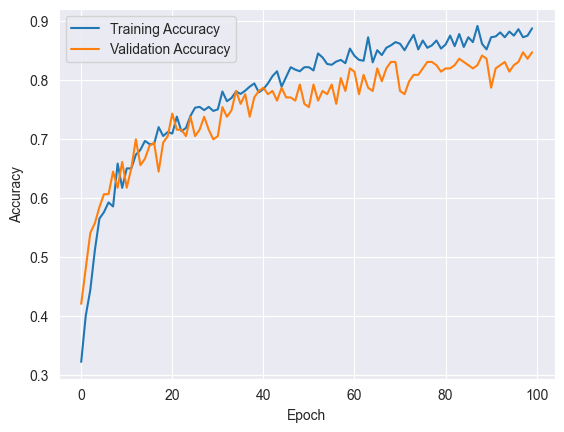

29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step

Final Evaluation Metrics:
Testing Accuracy: 0.9057017543859649
Training Accuracy: 0.8875171542167664
Validation Accuracy: 0.8469945192337036
Max Training Accuracy: 0.8916323781013489
Max Validation Accuracy: 0.8469945192337036
Classification Report:
              precision    recall  f1-score   support

           0       0.94      0.94      0.94       281
           1       0.97      0.74      0.84        53
           2       0.92      0.98      0.95       346
           3       0.89      0.89      0.89       155
           4       0.70      0.79      0.74        58
           5       0.00      0.00      0.00        19

    accuracy                           0.91       912
   macro avg       0.74      0.72      0.73       912
weighted avg       0.89      0.91      0.90       912

Confusion Matrix:
[[263   1  17   0   0   0]
 [ 14  39   0   0   0   0]
 [  3   0 340   3   0   0]
 [  0   0  14 138   3   0]
 [  0   0   0  12  46   0]
 [  0   0   0 

B:\Projects\PycharmProjects\PPMI_Research_on_Parkinson's\.venv\Lib\site-packages\sklearn\metrics\_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
B:\Projects\PycharmProjects\PPMI_Research_on_Parkinson's\.venv\Lib\site-packages\sklearn\metrics\_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
B:\Projects\PycharmProjects\PPMI_Research_on_Parkinson's\.venv\Lib\site-packages\sklearn\metrics\_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.

In [59]:
import pandas as pd
import numpy as np
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import accuracy_score, classification_report, confusion_matrix
from tensorflow.keras.models import Model
from tensorflow.keras.layers import Dense, LSTM, Dropout, Input
from tensorflow.keras.regularizers import l2
from tensorflow.keras.callbacks import History

# Load your dataset
data = pd.read_csv("B:/Projects/PycharmProjects/PPMI_Research_on_Parkinson's/src/mahbub/finalDatasetWithUPDRSScore.csv")

# Define non-feature, numerical, and categorical columns
non_feature_columns = ['Patient ID', 'Visit Date', 'UPDRS_SCORE', 'Visit']
numerical_features = [
    'Area', 'Circularity', 'ConvexArea', 'EquivDiameter', 'Extent',
    'FilledArea', 'Kurtosis', 'Major axis length', 'Mean',
    'Minor axis length', 'PA_ratio', 'Shannon_Entropy', 'Skewness',
    'Solidity', 'Standard Deviation', 'brightness', 'contrast',
    'correlation', 'dissimilarity', 'energy', 'gabor_energy',
    'gabor_entropy', 'homogeneity', 'lbp_energy', 'lbp_entropy',
    'DATSCAN_CAUDATE_R', 'DATSCAN_CAUDATE_L', 'DATSCAN_PUTAMEN_R',
    'DATSCAN_PUTAMEN_L', 'DATSCAN_PUTAMEN_R_ANT', 'DATSCAN_PUTAMEN_L_ANT'
]
categorical_features = [
    'NP1ANXS', 'NP1APAT', 'NP1COG', 'NP1DDS', 'NP1DPRS',
    'NP1HALL', 'NP1CNST', 'NP1FATG', 'NP1LTHD', 'NP1PAIN', 'NP1SLPD',
    'NP1SLPN', 'NP1URIN', 'NP2DRES', 'NP2EAT', 'NP2FREZ', 'NP2HOBB',
    'NP2HWRT', 'NP2HYGN', 'NP2RISE', 'NP2SALV', 'NP2SPCH', 'NP2SWAL',
    'NP2TRMR', 'NP2TURN', 'NP2WALK', 'NP3BRADY', 'NP3FACXP', 'NP3FRZGT',
    'NP3FTAPL', 'NP3FTAPR', 'NP3GAIT', 'NP3HMOVL', 'NP3HMOVR', 'NP3KTRML',
    'NP3KTRMR', 'NP3LGAGL', 'NP3LGAGR', 'NP3POSTR', 'NP3PRSPL', 'NP3PRSPR',
    'NP3PSTBL', 'NP3PTRML', 'NP3PTRMR', 'NP3RIGLL', 'NP3RIGLU', 'NP3RIGN',
    'NP3RIGRL', 'NP3RIGRU', 'NP3RISNG', 'NP3RTALJ', 'NP3RTALL', 'NP3RTALU',
    'NP3RTARL', 'NP3RTARU', 'NP3RTCON', 'NP3SPCH', 'NP3TTAPL', 'NP3TTAPR',
    'NHY'
]
target_column = "Disease_Severity"

# Scale numerical features
scaler = StandardScaler()
data[numerical_features] = scaler.fit_transform(data[numerical_features])

# One-hot encode the target variable (Disease_Severity)
data = pd.get_dummies(data, columns=[target_column], drop_first=False)

# Extract target columns after one-hot encoding
target_columns = list(data.filter(regex='Disease_Severity').columns)

# Separate features and target
X = data.drop(non_feature_columns + target_columns, axis=1)
y = data[target_columns]

# Convert X and y to numpy arrays
X = X.values
y = y.values

# Reshape X to match LSTM input shape (batch_size, timesteps, features)
X = X.reshape((X.shape[0], 1, X.shape[1]))

# Define function to create LSTM model
def create_lstm_model(input_shape, units=100, dropout_rate=0.2, l2_rate=0.01):
    inputs = Input(shape=input_shape)
    x = LSTM(units, kernel_regularizer=l2(l2_rate))(inputs)
    x = Dropout(dropout_rate)(x)
    outputs = Dense(y.shape[1], activation='softmax', kernel_regularizer=l2(l2_rate))(x)
    model = Model(inputs, outputs)
    model.compile(optimizer='adam', loss='categorical_crossentropy', metrics=['accuracy'])
    return model

# Define the best hyperparameters found
best_units = 100
best_dropout_rate = 0.2
best_l2_rate = 0.01

# Create and compile the LSTM model with best hyperparameters
input_shape = (1, X.shape[2])
lstm_model = create_lstm_model(input_shape, units=best_units, dropout_rate=best_dropout_rate, l2_rate=best_l2_rate)

# Fit the model
history = lstm_model.fit(X, y, epochs=100, batch_size=32, verbose=0, validation_split=0.2)

# Plot training and validation accuracy
import matplotlib.pyplot as plt

plt.plot(history.history['accuracy'], label='Training Accuracy')
plt.plot(history.history['val_accuracy'], label='Validation Accuracy')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.legend()
plt.show()

# Evaluate on the entire dataset
y_pred = lstm_model.predict(X)
y_true = np.argmax(y, axis=1)
y_pred_classes = np.argmax(y_pred, axis=1)

# Calculate final evaluation metrics
final_accuracy = accuracy_score(y_true, y_pred_classes)
final_classification_report = classification_report(y_true, y_pred_classes)
final_confusion_matrix = confusion_matrix(y_true, y_pred_classes)

# Print final evaluation metrics
print("\nFinal Evaluation Metrics:")
print(f"Testing Accuracy: {final_accuracy}")
print(f"Training Accuracy: {history.history['accuracy'][-1]}")
print(f"Validation Accuracy: {history.history['val_accuracy'][-1]}")
print(f"Max Training Accuracy: {max(history.history['accuracy'])}")
print(f"Max Validation Accuracy: {max(history.history['val_accuracy'])}")
print(f"Classification Report:\n{final_classification_report}")
print(f"Confusion Matrix:\n{final_confusion_matrix}")


In [45]:
import pandas as pd
import numpy as np
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import accuracy_score, classification_report, confusion_matrix
from tensorflow.keras.models import Model
from tensorflow.keras.layers import Dense, LSTM, Dropout, Input
from tensorflow.keras.regularizers import l2

# Load your dataset
data = pd.read_csv("B:/Projects/PycharmProjects/PPMI_Research_on_Parkinson's/src/mahbub/finalDatasetWithUPDRSScore.csv")

# Define non-feature, numerical, and categorical columns
non_feature_columns = ['Patient ID', 'Visit Date', 'UPDRS_SCORE', 'Visit']
numerical_features = [
    'Area', 'Circularity', 'ConvexArea', 'EquivDiameter', 'Extent',
    'FilledArea', 'Kurtosis', 'Major axis length', 'Mean',
    'Minor axis length', 'PA_ratio', 'Shannon_Entropy', 'Skewness',
    'Solidity', 'Standard Deviation', 'brightness', 'contrast',
    'correlation', 'dissimilarity', 'energy', 'gabor_energy',
    'gabor_entropy', 'homogeneity', 'lbp_energy', 'lbp_entropy',
    'DATSCAN_CAUDATE_R', 'DATSCAN_CAUDATE_L', 'DATSCAN_PUTAMEN_R',
    'DATSCAN_PUTAMEN_L', 'DATSCAN_PUTAMEN_R_ANT', 'DATSCAN_PUTAMEN_L_ANT'
]
categorical_features = [
    'NP1ANXS', 'NP1APAT', 'NP1COG', 'NP1DDS', 'NP1DPRS',
    'NP1HALL', 'NP1CNST', 'NP1FATG', 'NP1LTHD', 'NP1PAIN', 'NP1SLPD',
    'NP1SLPN', 'NP1URIN', 'NP2DRES', 'NP2EAT', 'NP2FREZ', 'NP2HOBB',
    'NP2HWRT', 'NP2HYGN', 'NP2RISE', 'NP2SALV', 'NP2SPCH', 'NP2SWAL',
    'NP2TRMR', 'NP2TURN', 'NP2WALK', 'NP3BRADY', 'NP3FACXP', 'NP3FRZGT',
    'NP3FTAPL', 'NP3FTAPR', 'NP3GAIT', 'NP3HMOVL', 'NP3HMOVR', 'NP3KTRML',
    'NP3KTRMR', 'NP3LGAGL', 'NP3LGAGR', 'NP3POSTR', 'NP3PRSPL', 'NP3PRSPR',
    'NP3PSTBL', 'NP3PTRML', 'NP3PTRMR', 'NP3RIGLL', 'NP3RIGLU', 'NP3RIGN',
    'NP3RIGRL', 'NP3RIGRU', 'NP3RISNG', 'NP3RTALJ', 'NP3RTALL', 'NP3RTALU',
    'NP3RTARL', 'NP3RTARU', 'NP3RTCON', 'NP3SPCH', 'NP3TTAPL', 'NP3TTAPR',
    'NHY'
]
target_column = "Disease_Severity"

# Scale numerical features
scaler = StandardScaler()
data[numerical_features] = scaler.fit_transform(data[numerical_features])

# One-hot encode the target variable (Disease_Severity)
data = pd.get_dummies(data, columns=[target_column], drop_first=False)

# Extract target columns after one-hot encoding
target_columns = list(data.filter(regex='Disease_Severity').columns)

# Separate features and target
X = data.drop(non_feature_columns + target_columns, axis=1)
y = data[target_columns]

# Convert X and y to numpy arrays
X = X.values
y = y.values

# Reshape X to match LSTM input shape (batch_size, timesteps, features)
X = X.reshape((X.shape[0], 1, X.shape[1]))

# Define function to create LSTM model
def create_lstm_model(input_shape, units=100, dropout_rate=0.2, l2_rate=0.01):
    inputs = Input(shape=input_shape)
    x = LSTM(units, kernel_regularizer=l2(l2_rate))(inputs)
    x = Dropout(dropout_rate)(x)
    outputs = Dense(y.shape[1], activation='softmax', kernel_regularizer=l2(l2_rate))(x)
    model = Model(inputs, outputs)
    model.compile(optimizer='adam', loss='categorical_crossentropy', metrics=['accuracy'])
    return model

# Define the best hyperparameters found
best_units = 100
best_dropout_rate = 0.2
best_l2_rate = 0.01

# Create and compile the LSTM model with best hyperparameters
input_shape = (1, X.shape[2])
lstm_model = create_lstm_model(input_shape, units=best_units, dropout_rate=best_dropout_rate, l2_rate=best_l2_rate)

# Fit the model
history = lstm_model.fit(X, y, epochs=100, batch_size=32, verbose=1, validation_split=0.2)

# Evaluate on the entire dataset
y_pred = lstm_model.predict(X)
y_true = np.argmax(y, axis=1)
y_pred_classes = np.argmax(y_pred, axis=1)

# Print final evaluation metrics
print("\nFinal Evaluation Metrics:")
final_accuracy = accuracy_score(y_true, y_pred_classes)
print(f"Accuracy: {final_accuracy}")

final_classification_report = classification_report(y_true, y_pred_classes)
print(f"Classification Report:\n{final_classification_report}")

final_confusion_matrix = confusion_matrix(y_true, y_pred_classes)
print(f"Confusion Matrix:\n{final_confusion_matrix}")

# Print validation accuracy
val_accuracy = history.history['val_accuracy'][-1]
print(f"\nValidation Accuracy: {val_accuracy}")

# Print testing accuracy (same as final accuracy)
print(f"Testing Accuracy: {final_accuracy}")


Epoch 1/100
23/23 ━━━━━━━━━━━━━━━━━━━━ 2s 10ms/step - accuracy: 0.2026 - loss: 3.2685 - val_accuracy: 0.4645 - val_loss: 2.4939
Epoch 2/100
23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.4245 - loss: 2.4218 - val_accuracy: 0.5191 - val_loss: 2.0158
Epoch 3/100
23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.4325 - loss: 2.0006 - val_accuracy: 0.5464 - val_loss: 1.7354
Epoch 4/100
23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.4919 - loss: 1.7758 - val_accuracy: 0.5738 - val_loss: 1.5559
Epoch 5/100
23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.5100 - loss: 1.5808 - val_accuracy: 0.5902 - val_loss: 1.4516
Epoch 6/100
23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.5067 - loss: 1.4966 - val_accuracy: 0.5738 - val_loss: 1.3825
Epoch 7/100
23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.5451 - loss: 1.3835 - val_accuracy: 0.5956 - val_loss: 1.3173
Epoch 8/100
23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.5692 - loss: 1.3336 - val_accuracy: 0.6175 - 

In [67]:
import pandas as pd
import numpy as np
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import StratifiedKFold
from sklearn.metrics import accuracy_score, classification_report, confusion_matrix
from tensorflow.keras.models import Model
from tensorflow.keras.layers import Dense, LSTM, Dropout, Input
from tensorflow.keras.regularizers import l2

# Load your dataset
data = pd.read_csv("B:/Projects/PycharmProjects/PPMI_Research_on_Parkinson's/src/mahbub/finalDatasetWithUPDRSScore.csv")

# Define non-feature, numerical, and categorical columns
non_feature_columns = ['Patient ID', 'Visit Date', 'UPDRS_SCORE', 'Visit']
numerical_features = [
    'Area', 'Circularity', 'ConvexArea', 'EquivDiameter', 'Extent',
    'FilledArea', 'Kurtosis', 'Major axis length', 'Mean',
    'Minor axis length', 'PA_ratio', 'Shannon_Entropy', 'Skewness',
    'Solidity', 'Standard Deviation', 'brightness', 'contrast',
    'correlation', 'dissimilarity', 'energy', 'gabor_energy',
    'gabor_entropy', 'homogeneity', 'lbp_energy', 'lbp_entropy',
    'DATSCAN_CAUDATE_R', 'DATSCAN_CAUDATE_L', 'DATSCAN_PUTAMEN_R',
    'DATSCAN_PUTAMEN_L', 'DATSCAN_PUTAMEN_R_ANT', 'DATSCAN_PUTAMEN_L_ANT'
]
categorical_features = [
    'NP1ANXS', 'NP1APAT', 'NP1COG', 'NP1DDS', 'NP1DPRS',
    'NP1HALL', 'NP1CNST', 'NP1FATG', 'NP1LTHD', 'NP1PAIN', 'NP1SLPD',
    'NP1SLPN', 'NP1URIN', 'NP2DRES', 'NP2EAT', 'NP2FREZ', 'NP2HOBB',
    'NP2HWRT', 'NP2HYGN', 'NP2RISE', 'NP2SALV', 'NP2SPCH', 'NP2SWAL',
    'NP2TRMR', 'NP2TURN', 'NP2WALK', 'NP3BRADY', 'NP3FACXP', 'NP3FRZGT',
    'NP3FTAPL', 'NP3FTAPR', 'NP3GAIT', 'NP3HMOVL', 'NP3HMOVR', 'NP3KTRML',
    'NP3KTRMR', 'NP3LGAGL', 'NP3LGAGR', 'NP3POSTR', 'NP3PRSPL', 'NP3PRSPR',
    'NP3PSTBL', 'NP3PTRML', 'NP3PTRMR', 'NP3RIGLL', 'NP3RIGLU', 'NP3RIGN',
    'NP3RIGRL', 'NP3RIGRU', 'NP3RISNG', 'NP3RTALJ', 'NP3RTALL', 'NP3RTALU',
    'NP3RTARL', 'NP3RTARU', 'NP3RTCON', 'NP3SPCH', 'NP3TTAPL', 'NP3TTAPR',
    'NHY'
]
target_column = "Disease_Severity"

# Scale numerical features
scaler = StandardScaler()
data[numerical_features] = scaler.fit_transform(data[numerical_features])

# One-hot encode the target variable (Disease_Severity)
data = pd.get_dummies(data, columns=[target_column], drop_first=False)

# Extract target columns after one-hot encoding
target_columns = list(data.filter(regex='Disease_Severity').columns)

# Separate features and target
X = data.drop(non_feature_columns + target_columns, axis=1)
y = data[target_columns]

# Convert X and y to numpy arrays
X = X.values
y = y.values

# Reshape X to match LSTM input shape (batch_size, timesteps, features)
X = X.reshape((X.shape[0], 1, X.shape[1]))

# Define function to create LSTM model
def create_lstm_model(input_shape, units=100, dropout_rate=0.2, l2_rate=0.01):
    inputs = Input(shape=input_shape)
    x = LSTM(units, kernel_regularizer=l2(l2_rate))(inputs)
    x = Dropout(dropout_rate)(x)
    outputs = Dense(y.shape[1], activation='softmax', kernel_regularizer=l2(l2_rate))(x)
    model = Model(inputs, outputs)
    model.compile(optimizer='adam', loss='categorical_crossentropy', metrics=['accuracy'])
    return model

# Define Stratified K-Fold cross-validation
k_folds = 5
skf = StratifiedKFold(n_splits=k_folds, shuffle=True, random_state=42)

# Initialize lists to store evaluation metrics across folds
accuracy_scores = []
train_accuracy_scores = []
val_accuracy_scores = []

# Perform Stratified K-Fold cross-validation
fold = 0
for train_index, test_index in skf.split(X, np.argmax(y, axis=1)):
    fold += 1
    print(f"Fold {fold}/{k_folds}")

    X_train, X_test = X[train_index], X[test_index]
    y_train, y_test = y[train_index], y[test_index]

    # Create and compile the LSTM model
    lstm_model = create_lstm_model(input_shape=X.shape[1:], units=100, dropout_rate=0.2, l2_rate=0.01)

    # Fit the model
    history = lstm_model.fit(X_train, y_train, epochs=100, batch_size=32, verbose=0, validation_split=0.2)

    # Evaluate on the test set
    y_pred = lstm_model.predict(X_test)
    y_pred_classes = np.argmax(y_pred, axis=1)
    y_true = np.argmax(y_test, axis=1)

    # Calculate metrics
    accuracy = accuracy_score(y_true, y_pred_classes)
    train_accuracy = np.max(history.history['accuracy'])
    val_accuracy = np.max(history.history['val_accuracy'])

    # Print evaluation metrics for the current fold
    print(f"Training Accuracy: {train_accuracy}")
    print(f"Validation Accuracy: {val_accuracy}")
    print(f"Testing Accuracy: {accuracy}")

    # Append metrics to lists
    accuracy_scores.append(accuracy)
    train_accuracy_scores.append(train_accuracy)
    val_accuracy_scores.append(val_accuracy)

    print("-" * 50)

# Print average validation accuracy across folds
print(f"Average Validation Accuracy: {np.mean(val_accuracy_scores)}")

# Print best evaluation accuracy and corresponding training accuracy
best_val_accuracy_fold = np.argmax(val_accuracy_scores)
print(f"Best Validation Accuracy: {val_accuracy_scores[best_val_accuracy_fold]}")
print(f"Corresponding Training Accuracy: {train_accuracy_scores[best_val_accuracy_fold]}")
print(f"Fold Number: {best_val_accuracy_fold + 1}")

# Print best test accuracy and corresponding validation and training accuracies
best_test_accuracy_fold = np.argmax(accuracy_scores)
print(f"Best Testing Accuracy: {accuracy_scores[best_test_accuracy_fold]}")
print(f"Corresponding Validation Accuracy: {val_accuracy_scores[best_test_accuracy_fold]}")
print(f"Corresponding Training Accuracy: {train_accuracy_scores[best_test_accuracy_fold]}")
print(f"Fold Number: {best_test_accuracy_fold + 1}")


Fold 1/5
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step
Training Accuracy: 0.9108061790466309
Validation Accuracy: 0.8082191944122314
Testing Accuracy: 0.7158469945355191
--------------------------------------------------
Fold 2/5
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step
Training Accuracy: 0.8816466331481934
Validation Accuracy: 0.767123281955719
Testing Accuracy: 0.7595628415300546
--------------------------------------------------
Fold 3/5
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
Training Accuracy: 0.9041095972061157
Validation Accuracy: 0.835616409778595
Testing Accuracy: 0.7362637362637363
--------------------------------------------------
Fold 4/5
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
Training Accuracy: 0.8852739930152893
Validation Accuracy: 0.8219178318977356
Testing Accuracy: 0.7417582417582418
--------------------------------------------------
Fold 5/5
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
Training Accuracy: 0.8989726305007935
Validation Accuracy: 0.8219178318977356
Testing Accuracy: 0.76373

# finding best hyper param by bydirectional lstm

In [2]:
import pandas as pd
import numpy as np
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import StratifiedKFold, GridSearchCV
from tensorflow.keras.models import Model
from tensorflow.keras.layers import Dense, LSTM, Dropout, Input, Bidirectional
from tensorflow.keras.regularizers import l2
from tensorflow.keras.callbacks import EarlyStopping
from scikeras.wrappers import KerasClassifier

# Load your dataset
data = pd.read_csv("B:/Projects/PycharmProjects/PPMI_Research_on_Parkinson's/src/mahbub/finalDatasetWithUPDRSScore.csv")

# Define non-feature, numerical, and categorical columns
non_feature_columns = ['Patient ID', 'Visit Date', 'UPDRS_SCORE', 'Visit']
numerical_features = [
    'Area', 'Circularity', 'ConvexArea', 'EquivDiameter', 'Extent',
    'FilledArea', 'Kurtosis', 'Major axis length', 'Mean',
    'Minor axis length', 'PA_ratio', 'Shannon_Entropy', 'Skewness',
    'Solidity', 'Standard Deviation', 'brightness', 'contrast',
    'correlation', 'dissimilarity', 'energy', 'gabor_energy',
    'gabor_entropy', 'homogeneity', 'lbp_energy', 'lbp_entropy',
    'DATSCAN_CAUDATE_R', 'DATSCAN_CAUDATE_L', 'DATSCAN_PUTAMEN_R',
    'DATSCAN_PUTAMEN_L', 'DATSCAN_PUTAMEN_R_ANT', 'DATSCAN_PUTAMEN_L_ANT'
]
categorical_features = [
    'NP1ANXS', 'NP1APAT', 'NP1COG', 'NP1DDS', 'NP1DPRS',
    'NP1HALL', 'NP1CNST', 'NP1FATG', 'NP1LTHD', 'NP1PAIN', 'NP1SLPD',
    'NP1SLPN', 'NP1URIN', 'NP2DRES', 'NP2EAT', 'NP2FREZ', 'NP2HOBB',
    'NP2HWRT', 'NP2HYGN', 'NP2RISE', 'NP2SALV', 'NP2SPCH', 'NP2SWAL',
    'NP2TRMR', 'NP2TURN', 'NP2WALK', 'NP3BRADY', 'NP3FACXP', 'NP3FRZGT',
    'NP3FTAPL', 'NP3FTAPR', 'NP3GAIT', 'NP3HMOVL', 'NP3HMOVR', 'NP3KTRML',
    'NP3KTRMR', 'NP3LGAGL', 'NP3LGAGR', 'NP3POSTR', 'NP3PRSPL', 'NP3PRSPR',
    'NP3PSTBL', 'NP3PTRML', 'NP3PTRMR', 'NP3RIGLL', 'NP3RIGLU', 'NP3RIGN',
    'NP3RIGRL', 'NP3RIGRU', 'NP3RISNG', 'NP3RTALJ', 'NP3RTALL', 'NP3RTALU',
    'NP3RTARL', 'NP3RTARU', 'NP3RTCON', 'NP3SPCH', 'NP3TTAPL', 'NP3TTAPR',
    'NHY'
]
target_column = "Disease_Severity"

# Scale numerical features
scaler = StandardScaler()
data[numerical_features] = scaler.fit_transform(data[numerical_features])

# One-hot encode the target variable (Disease_Severity)
data = pd.get_dummies(data, columns=[target_column], drop_first=False)

# Extract target columns after one-hot encoding
target_columns = list(data.filter(regex='Disease_Severity').columns)

# Separate features and target
X = data.drop(non_feature_columns + target_columns, axis=1)
y = data[target_columns]

# Convert X and y to numpy arrays
X = X.values
y = y.values

# Reshape X to match LSTM input shape (batch_size, timesteps, features)
X = X.reshape((X.shape[0], 1, X.shape[1]))

# Function to create Bidirectional LSTM model
def create_bidirectional_lstm_model(input_shape, output_shape, units=50, dropout_rate=0.5, l2_rate=0.001):
    inputs = Input(shape=input_shape)
    x = Bidirectional(LSTM(units, kernel_regularizer=l2(l2_rate)))(inputs)
    x = Dropout(dropout_rate)(x)
    outputs = Dense(output_shape, activation='softmax', kernel_regularizer=l2(l2_rate))(x)
    model = Model(inputs, outputs)
    model.compile(optimizer='adam', loss='categorical_crossentropy', metrics=['accuracy'])
    return model

# Wrap Keras model for use with scikit-learn
input_shape = (1, X.shape[2])
output_shape = y.shape[1]

model = KerasClassifier(model=create_bidirectional_lstm_model, input_shape=input_shape, output_shape=output_shape, verbose=0)

# Define hyperparameters for GridSearchCV
param_grid = {
    'model__units': [20, 50, 100],
    'model__dropout_rate': [0.2, 0.5],
    'model__l2_rate': [0.001, 0.01],
    'epochs': [50, 100],
    'batch_size': [32, 64]
}

# Create StratifiedKFold cross-validation object
skf = StratifiedKFold(n_splits=7, shuffle=True, random_state=42)

# Helper function to stratify by multilabel target
def multilabel_stratified_kfold(X, y, skf):
    stratify_labels = np.array([''.join(str(int(class_)) for class_ in row) for row in y])
    for train_idx, test_idx in skf.split(X, stratify_labels):
        yield train_idx, test_idx

# Perform GridSearchCV with StratifiedKFold
grid = GridSearchCV(estimator=model, param_grid=param_grid, cv=list(multilabel_stratified_kfold(X, y, skf)))
grid_result = grid.fit(X, y)

# Summarize results
print("Best: %f using %s" % (grid_result.best_score_, grid_result.best_params_))
means = grid_result.cv_results_['mean_test_score']
stds = grid_result.cv_results_['std_test_score']
params = grid_result.cv_results_['params']
for mean, std, param in zip(means, stds, params):
    print("%f (%f) with: %r" % (mean, std, param))


Best: 0.813598 using {'batch_size': 32, 'epochs': 100, 'model__dropout_rate': 0.2, 'model__l2_rate': 0.01, 'model__units': 100}
0.687518 (0.043114) with: {'batch_size': 32, 'epochs': 50, 'model__dropout_rate': 0.2, 'model__l2_rate': 0.001, 'model__units': 20}
0.720435 (0.040078) with: {'batch_size': 32, 'epochs': 50, 'model__dropout_rate': 0.2, 'model__l2_rate': 0.001, 'model__units': 50}
0.730274 (0.030201) with: {'batch_size': 32, 'epochs': 50, 'model__dropout_rate': 0.2, 'model__l2_rate': 0.001, 'model__units': 100}
0.699547 (0.033323) with: {'batch_size': 32, 'epochs': 50, 'model__dropout_rate': 0.2, 'model__l2_rate': 0.01, 'model__units': 20}
0.741314 (0.031447) with: {'batch_size': 32, 'epochs': 50, 'model__dropout_rate': 0.2, 'model__l2_rate': 0.01, 'model__units': 50}
0.764282 (0.029430) with: {'batch_size': 32, 'epochs': 50, 'model__dropout_rate': 0.2, 'model__l2_rate': 0.01, 'model__units': 100}
0.663401 (0.037767) with: {'batch_size': 32, 'epochs': 50, 'model__dropout_rate':

In [1]:


import pandas as pd
import numpy as np
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import StratifiedKFold, GridSearchCV
from tensorflow.keras.models import Model
from tensorflow.keras.layers import Dense, LSTM, Dropout, Input, Bidirectional
from tensorflow.keras.regularizers import l2
from scikeras.wrappers import KerasClassifier

# Load your dataset
data = pd.read_csv("B:/Projects/PycharmProjects/PPMI_Research_on_Parkinson's/src/mahbub/finalDatasetWithUPDRSScore.csv")

# Define non-feature, numerical, and categorical columns
non_feature_columns = ['Patient ID', 'Visit Date', 'UPDRS_SCORE', 'Visit']
numerical_features = [
    'Area', 'Circularity', 'ConvexArea', 'EquivDiameter', 'Extent',
    'FilledArea', 'Kurtosis', 'Major axis length', 'Mean',
    'Minor axis length', 'PA_ratio', 'Shannon_Entropy', 'Skewness',
    'Solidity', 'Standard Deviation', 'brightness', 'contrast',
    'correlation', 'dissimilarity', 'energy', 'gabor_energy',
    'gabor_entropy', 'homogeneity', 'lbp_energy', 'lbp_entropy',
    'DATSCAN_CAUDATE_R', 'DATSCAN_CAUDATE_L', 'DATSCAN_PUTAMEN_R',
    'DATSCAN_PUTAMEN_L', 'DATSCAN_PUTAMEN_R_ANT', 'DATSCAN_PUTAMEN_L_ANT'
]
categorical_features = [
    'NP1ANXS', 'NP1APAT', 'NP1COG', 'NP1DDS', 'NP1DPRS',
    'NP1HALL', 'NP1CNST', 'NP1FATG', 'NP1LTHD', 'NP1PAIN', 'NP1SLPD',
    'NP1SLPN', 'NP1URIN', 'NP2DRES', 'NP2EAT', 'NP2FREZ', 'NP2HOBB',
    'NP2HWRT', 'NP2HYGN', 'NP2RISE', 'NP2SALV', 'NP2SPCH', 'NP2SWAL',
    'NP2TRMR', 'NP2TURN', 'NP2WALK', 'NP3BRADY', 'NP3FACXP', 'NP3FRZGT',
    'NP3FTAPL', 'NP3FTAPR', 'NP3GAIT', 'NP3HMOVL', 'NP3HMOVR', 'NP3KTRML',
    'NP3KTRMR', 'NP3LGAGL', 'NP3LGAGR', 'NP3POSTR', 'NP3PRSPL', 'NP3PRSPR',
    'NP3PSTBL', 'NP3PTRML', 'NP3PTRMR', 'NP3RIGLL', 'NP3RIGLU', 'NP3RIGN',
    'NP3RIGRL', 'NP3RIGRU', 'NP3RISNG', 'NP3RTALJ', 'NP3RTALL', 'NP3RTALU',
    'NP3RTARL', 'NP3RTARU', 'NP3RTCON', 'NP3SPCH', 'NP3TTAPL', 'NP3TTAPR',
    'NHY'
]
target_column = "Disease_Severity"

# Scale numerical features
scaler = StandardScaler()
data[numerical_features] = scaler.fit_transform(data[numerical_features])

# One-hot encode the target variable (Disease_Severity)
data = pd.get_dummies(data, columns=[target_column], drop_first=False)

# Extract target columns after one-hot encoding
target_columns = list(data.filter(regex='Disease_Severity').columns)

# Separate features and target
X = data.drop(non_feature_columns + target_columns, axis=1)
y = data[target_columns]

# Convert X and y to numpy arrays
X = X.values
y = y.values

# Reshape X to match LSTM input shape (batch_size, timesteps, features)
X = X.reshape((X.shape[0], 1, X.shape[1]))

# Function to create Bidirectional LSTM model
def create_bidirectional_lstm_model(input_shape, output_shape, units=50, dropout_rate=0.5, l2_rate=0.001):
    inputs = Input(shape=input_shape)
    x = Bidirectional(LSTM(units, kernel_regularizer=l2(l2_rate)))(inputs)
    x = Dropout(dropout_rate)(x)
    outputs = Dense(output_shape, activation='softmax', kernel_regularizer=l2(l2_rate))(x)
    model = Model(inputs, outputs)
    model.compile(optimizer='adam', loss='categorical_crossentropy', metrics=['accuracy'])
    return model

# Wrap Keras model for use with scikit-learn
input_shape = (1, X.shape[2])
output_shape = y.shape[1]

model = KerasClassifier(model=create_bidirectional_lstm_model, input_shape=input_shape, output_shape=output_shape, verbose=0)

# Define hyperparameters for GridSearchCV

param_grid = {
    'model__units': [20, 50, 100],
    'model__dropout_rate': [0.1,0.2, 0.5],
    'model__l2_rate': [0.001, 0.01],
    'epochs': [50, 100],
    'batch_size': [32, 64]
}

# Create StratifiedKFold cross-validation object
skf = StratifiedKFold(n_splits=7, shuffle=True, random_state=42)

# Helper function to stratify by multilabel target
def multilabel_stratified_kfold(X, y, skf):
    stratify_labels = np.array([''.join(str(int(class_)) for class_ in row) for row in y])
    for train_idx, test_idx in skf.split(X, stratify_labels):
        yield train_idx, test_idx

# Perform GridSearchCV with StratifiedKFold
grid = GridSearchCV(estimator=model, param_grid=param_grid, cv=list(multilabel_stratified_kfold(X, y, skf)))
grid_result = grid.fit(X, y)

# Summarize results
print("Best: %f using %s" % (grid_result.best_score_, grid_result.best_params_))
means = grid_result.cv_results_['mean_test_score']
stds = grid_result.cv_results_['std_test_score']
params = grid_result.cv_results_['params']
for mean, std, param in zip(means, stds, params):
    print("%f (%f) with: %r" % (mean, std, param))

# Refit the best model on the full dataset
best_model = grid_result.best_estimator_   
best_model.fit(X, y)

# Evaluate the best model on the training set
best_model_train_loss, best_model_train_accuracy = best_model.evaluate(X, y)
print(f"Best Model - Train Loss: {best_model_train_loss}, Train Accuracy: {best_model_train_accuracy}")

# For evaluation on a separate test set, split the data (uncomment and use if you have a test set)
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)
best_model.fit(X_train, y_train)
best_model_test_loss, best_model_test_accuracy = best_model.evaluate(X_test, y_test)

# Print final evaluation
# Uncomment the next line if you have a separate test set
print(f"Best Model - Test Loss: {best_model_test_loss}, Test Accuracy: {best_model_test_accuracy}")


Best: 0.826810 using {'batch_size': 32, 'epochs': 100, 'model__dropout_rate': 0.1, 'model__l2_rate': 0.01, 'model__units': 100}
0.678819 (0.042808) with: {'batch_size': 32, 'epochs': 50, 'model__dropout_rate': 0.1, 'model__l2_rate': 0.001, 'model__units': 20}
0.707365 (0.050149) with: {'batch_size': 32, 'epochs': 50, 'model__dropout_rate': 0.1, 'model__l2_rate': 0.001, 'model__units': 50}
0.730333 (0.043363) with: {'batch_size': 32, 'epochs': 50, 'model__dropout_rate': 0.1, 'model__l2_rate': 0.001, 'model__units': 100}
0.686419 (0.034983) with: {'batch_size': 32, 'epochs': 50, 'model__dropout_rate': 0.1, 'model__l2_rate': 0.01, 'model__units': 20}
0.722616 (0.033446) with: {'batch_size': 32, 'epochs': 50, 'model__dropout_rate': 0.1, 'model__l2_rate': 0.01, 'model__units': 50}
0.757680 (0.009756) with: {'batch_size': 32, 'epochs': 50, 'model__dropout_rate': 0.1, 'model__l2_rate': 0.01, 'model__units': 100}
0.695260 (0.045265) with: {'batch_size': 32, 'epochs': 50, 'model__dropout_rate':

TypeError: cannot unpack non-iterable float object

In [3]:
best_model_train_loss, best_model_train_accuracy = best_model.model_.evaluate(X, y)
print(f"Best Model - Train Loss: {best_model_train_loss}, Train Accuracy: {best_model_train_accuracy}")

# For evaluation on a separate test set, split the data (uncomment and use if you have a test set)
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)
best_model.fit(X_train, y_train)
best_model_test_loss, best_model_test_accuracy = best_model.model_.evaluate(X_test, y_test)

# Print final evaluation
# Uncomment the next line if you have a separate test set
print(f"Best Model - Test Loss: {best_model_test_loss}, Test Accuracy: {best_model_test_accuracy}")

29/29 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.9153 - loss: 0.6263 
Best Model - Train Loss: 0.6093320846557617, Train Accuracy: 0.9320175647735596
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.7844 - loss: 0.8041  
Best Model - Test Loss: 0.7875587344169617, Test Accuracy: 0.8142076730728149


In [1]:
import pandas as pd
import numpy as np
from sklearn.preprocessing import MinMaxScaler, StandardScaler
from sklearn.model_selection import StratifiedKFold, GridSearchCV, train_test_split
from tensorflow.keras.models import Model
from tensorflow.keras.layers import Dense, LSTM, Dropout, Input
from tensorflow.keras.regularizers import l2
from tensorflow.keras.callbacks import EarlyStopping
from scikeras.wrappers import KerasClassifier

# Load your dataset
data = pd.read_csv("B:/Projects/PycharmProjects/PPMI_Research_on_Parkinson's/src/mahbub/finalDatasetWithUPDRSScore.csv")

# Define non-feature, numerical, and categorical columns
non_feature_columns = ['Patient ID', 'Visit Date', 'UPDRS_SCORE', 'Visit', 'Visit_int']
numerical_features = [
    'Area', 'Circularity', 'ConvexArea', 'EquivDiameter', 'Extent',
    'FilledArea', 'Kurtosis', 'Major axis length', 'Mean',
    'Minor axis length', 'PA_ratio', 'Shannon_Entropy', 'Skewness',
    'Solidity', 'Standard Deviation', 'brightness', 'contrast',
    'correlation', 'dissimilarity', 'energy', 'gabor_energy',
    'gabor_entropy', 'homogeneity', 'lbp_energy', 'lbp_entropy',
    'DATSCAN_CAUDATE_R', 'DATSCAN_CAUDATE_L', 'DATSCAN_PUTAMEN_R',
    'DATSCAN_PUTAMEN_L', 'DATSCAN_PUTAMEN_R_ANT', 'DATSCAN_PUTAMEN_L_ANT'
]
categorical_features = [
    'NP1ANXS', 'NP1APAT', 'NP1COG', 'NP1DDS', 'NP1DPRS',
    'NP1HALL', 'NP1CNST', 'NP1FATG', 'NP1LTHD', 'NP1PAIN', 'NP1SLPD',
    'NP1SLPN', 'NP1URIN', 'NP2DRES', 'NP2EAT', 'NP2FREZ', 'NP2HOBB',
    'NP2HWRT', 'NP2HYGN', 'NP2RISE', 'NP2SALV', 'NP2SPCH', 'NP2SWAL',
    'NP2TRMR', 'NP2TURN', 'NP2WALK', 'NP3BRADY', 'NP3FACXP', 'NP3FRZGT',
    'NP3FTAPL', 'NP3FTAPR', 'NP3GAIT', 'NP3HMOVL', 'NP3HMOVR', 'NP3KTRML',
    'NP3KTRMR', 'NP3LGAGL', 'NP3LGAGR', 'NP3POSTR', 'NP3PRSPL', 'NP3PRSPR',
    'NP3PSTBL', 'NP3PTRML', 'NP3PTRMR', 'NP3RIGLL', 'NP3RIGLU', 'NP3RIGN',
    'NP3RIGRL', 'NP3RIGRU', 'NP3RISNG', 'NP3RTALJ', 'NP3RTALL', 'NP3RTALU',
    'NP3RTARL', 'NP3RTARU', 'NP3RTCON', 'NP3SPCH', 'NP3TTAPL', 'NP3TTAPR',
    'NHY'
]
target_column = "Disease_Severity"

# Scale numerical features
scaler = MinMaxScaler()
data[numerical_features] = scaler.fit_transform(data[numerical_features])

# One-hot encode the target variable (Disease_Severity)
data = pd.get_dummies(data, columns=[target_column], drop_first=False)

# Extract target columns after one-hot encoding
target_columns = list(data.filter(regex='Disease_Severity').columns)

# Function to create sequences
def create_sequences(data, non_feature_columns, numerical_features, categorical_features, target_columns):
    sequences = []
    targets = []
    grouped = data.groupby('Patient ID')

    for patient_id, group in grouped:
        # Drop non-feature columns
        group = group.drop(non_feature_columns, axis=1)
        
        # Select numerical and categorical features
        patient_data = group[numerical_features + categorical_features].values
        num_visits = len(patient_data)
        
        # Ensure exactly 4 visits per patient
        if num_visits >= 4:
            sequences.append(patient_data[-4:])
        else:
            # Pad with zeros if fewer than 4 visits
            padding = np.zeros((4 - num_visits, len(numerical_features + categorical_features)))
            padded_sequence = np.concatenate([padding, patient_data])
            sequences.append(padded_sequence)
        
        # Get the target sequence (last visit class one-hot encoded)
        target = group[target_columns].values[-1]
        targets.append(target)

    # Convert lists to numpy arrays
    sequences = np.array(sequences)
    targets = np.array(targets)
    
    return sequences, targets

# Create sequences
sequences, targets = create_sequences(data, non_feature_columns, numerical_features, categorical_features, target_columns)

# Convert sequences and targets to numpy arrays
X = np.array(sequences)
y = np.array(targets)

# Reshape X to match LSTM input shape (batch_size, timesteps, features)
X = X.reshape((X.shape[0], X.shape[1], X.shape[2]))

# Split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Function to create LSTM model
def create_lstm_model(input_shape, output_shape, units=50, dropout_rate=0.5, l2_rate=0.001):
    inputs = Input(shape=input_shape)
    x = LSTM(units, kernel_regularizer=l2(l2_rate))(inputs)
    x = Dropout(dropout_rate)(x)
    outputs = Dense(output_shape, activation='softmax', kernel_regularizer=l2(l2_rate))(x)
    model = Model(inputs, outputs)
    model.compile(optimizer='adam', loss='categorical_crossentropy', metrics=['accuracy'])
    return model

# Wrap Keras model for use with scikit-learn
input_shape = (X_train.shape[1], X_train.shape[2])
output_shape = y_train.shape[1]

model = KerasClassifier(model=create_lstm_model, input_shape=input_shape, output_shape=output_shape, verbose=0)

# Define hyperparameters for GridSearchCV
param_grid = {
    'model__units': [20, 50, 100],
    'model__dropout_rate': [0.2, 0.5],
    'model__l2_rate': [0.001, 0.01],
    'epochs': [50, 100],
    'batch_size': [32, 64]
}

# Create StratifiedKFold cross-validation object
skf = StratifiedKFold(n_splits=5, shuffle=True, random_state=42)

# Helper function to stratify by multilabel target
def multilabel_stratified_kfold(X, y, skf):
    stratify_labels = np.array([''.join(str(int(class_)) for class_ in row) for row in y])
    for train_idx, test_idx in skf.split(X, stratify_labels):
        yield train_idx, test_idx

# Perform GridSearchCV with StratifiedKFold
grid = GridSearchCV(estimator=model, param_grid=param_grid, cv=list(multilabel_stratified_kfold(X, y, skf)))
grid_result = grid.fit(X, y)

# Summarize results
print("Best: %f using %s" % (grid_result.best_score_, grid_result.best_params_))
means = grid_result.cv_results_['mean_test_score']
stds = grid_result.cv_results_['std_test_score']
params = grid_result.cv_results_['params'] 
for mean, std, param in zip(means, stds, params):
    print("%f (%f) with: %r" % (mean, std, param))

# Evaluate the best model
best_model = grid_result.best_estimator_.model_
best_model_train_loss, best_model_train_accuracy = best_model.evaluate(X_train, y_train, verbose=0)
best_model_test_loss, best_model_test_accuracy = best_model.evaluate(X_test, y_test, verbose=0)

print(f"Best Model - Train Loss: {best_model_train_loss}, Train Accuracy: {best_model_train_accuracy}")
print(f"Best Model - Test Loss: {best_model_test_loss}, Test Accuracy: {best_model_test_accuracy}")


B:\Projects\PycharmProjects\PPMI_Research_on_Parkinson's\.venv\Lib\site-packages\sklearn\model_selection\_split.py:737: UserWarning: The least populated class in y has only 4 members, which is less than n_splits=5.
  warnings.warn(


Best: 0.578744 using {'batch_size': 64, 'epochs': 100, 'model__dropout_rate': 0.2, 'model__l2_rate': 0.01, 'model__units': 20}
0.539807 (0.056392) with: {'batch_size': 32, 'epochs': 50, 'model__dropout_rate': 0.2, 'model__l2_rate': 0.001, 'model__units': 20}
0.530435 (0.080006) with: {'batch_size': 32, 'epochs': 50, 'model__dropout_rate': 0.2, 'model__l2_rate': 0.001, 'model__units': 50}
0.495266 (0.047454) with: {'batch_size': 32, 'epochs': 50, 'model__dropout_rate': 0.2, 'model__l2_rate': 0.001, 'model__units': 100}
0.508696 (0.062797) with: {'batch_size': 32, 'epochs': 50, 'model__dropout_rate': 0.2, 'model__l2_rate': 0.01, 'model__units': 20}
0.526377 (0.014876) with: {'batch_size': 32, 'epochs': 50, 'model__dropout_rate': 0.2, 'model__l2_rate': 0.01, 'model__units': 50}
0.495266 (0.059650) with: {'batch_size': 32, 'epochs': 50, 'model__dropout_rate': 0.2, 'model__l2_rate': 0.01, 'model__units': 100}
0.521449 (0.053422) with: {'batch_size': 32, 'epochs': 50, 'model__dropout_rate': 

In [1]:
import pandas as pd
import numpy as np
from sklearn.preprocessing import MinMaxScaler, StandardScaler
from sklearn.model_selection import StratifiedKFold, GridSearchCV, train_test_split
from tensorflow.keras.models import Model
from tensorflow.keras.layers import Dense, LSTM, Dropout, Input
from tensorflow.keras.regularizers import l2
from tensorflow.keras.callbacks import EarlyStopping
from scikeras.wrappers import KerasClassifier

# Load your dataset
data = pd.read_csv("B:/Projects/PycharmProjects/PPMI_Research_on_Parkinson's/src/mahbub/finalDatasetWithUPDRSScore.csv")

# Define non-feature, numerical, and categorical columns
non_feature_columns = ['Patient ID', 'Visit Date', 'UPDRS_SCORE', 'Visit', 'Visit_int']
numerical_features = [
    'Area', 'Circularity', 'ConvexArea', 'EquivDiameter', 'Extent',
    'FilledArea', 'Kurtosis', 'Major axis length', 'Mean',
    'Minor axis length', 'PA_ratio', 'Shannon_Entropy', 'Skewness',
    'Solidity', 'Standard Deviation', 'brightness', 'contrast',
    'correlation', 'dissimilarity', 'energy', 'gabor_energy',
    'gabor_entropy', 'homogeneity', 'lbp_energy', 'lbp_entropy',
    'DATSCAN_CAUDATE_R', 'DATSCAN_CAUDATE_L', 'DATSCAN_PUTAMEN_R',
    'DATSCAN_PUTAMEN_L', 'DATSCAN_PUTAMEN_R_ANT', 'DATSCAN_PUTAMEN_L_ANT'
]
categorical_features = [
    'NP1ANXS', 'NP1APAT', 'NP1COG', 'NP1DDS', 'NP1DPRS',
    'NP1HALL', 'NP1CNST', 'NP1FATG', 'NP1LTHD', 'NP1PAIN', 'NP1SLPD',
    'NP1SLPN', 'NP1URIN', 'NP2DRES', 'NP2EAT', 'NP2FREZ', 'NP2HOBB',
    'NP2HWRT', 'NP2HYGN', 'NP2RISE', 'NP2SALV', 'NP2SPCH', 'NP2SWAL',
    'NP2TRMR', 'NP2TURN', 'NP2WALK', 'NP3BRADY', 'NP3FACXP', 'NP3FRZGT',
    'NP3FTAPL', 'NP3FTAPR', 'NP3GAIT', 'NP3HMOVL', 'NP3HMOVR', 'NP3KTRML',
    'NP3KTRMR', 'NP3LGAGL', 'NP3LGAGR', 'NP3POSTR', 'NP3PRSPL', 'NP3PRSPR',
    'NP3PSTBL', 'NP3PTRML', 'NP3PTRMR', 'NP3RIGLL', 'NP3RIGLU', 'NP3RIGN',
    'NP3RIGRL', 'NP3RIGRU', 'NP3RISNG', 'NP3RTALJ', 'NP3RTALL', 'NP3RTALU',
    'NP3RTARL', 'NP3RTARU', 'NP3RTCON', 'NP3SPCH', 'NP3TTAPL', 'NP3TTAPR',
    'NHY'
]
target_column = "Disease_Severity"

# Scale numerical features
scaler = MinMaxScaler()
data[numerical_features] = scaler.fit_transform(data[numerical_features])

# One-hot encode the target variable (Disease_Severity)
data = pd.get_dummies(data, columns=[target_column], drop_first=False)

# Extract target columns after one-hot encoding
target_columns = list(data.filter(regex='Disease_Severity').columns)

# Function to create sequences
def create_sequences(data, non_feature_columns, numerical_features, categorical_features, target_columns):
    sequences = []
    targets = []
    grouped = data.groupby('Patient ID')

    for patient_id, group in grouped:
        # Drop non-feature columns
        group = group.drop(non_feature_columns, axis=1)
        
        # Select numerical and categorical features
        patient_data = group[numerical_features + categorical_features].values
        num_visits = len(patient_data)
        
        # Ensure exactly 4 visits per patient
        if num_visits >= 4:
            sequences.append(patient_data[-4:])
        else:
            # Pad with zeros if fewer than 4 visits
            padding = np.zeros((4 - num_visits, len(numerical_features + categorical_features)))
            padded_sequence = np.concatenate([padding, patient_data])
            sequences.append(padded_sequence)
        
        # Get the target sequence (last visit class one-hot encoded)
        target = group[target_columns].values[-1]
        targets.append(target)

    # Convert lists to numpy arrays
    sequences = np.array(sequences)
    targets = np.array(targets)
    
    return sequences, targets

# Create sequences
sequences, targets = create_sequences(data, non_feature_columns, numerical_features, categorical_features, target_columns)

# Convert sequences and targets to numpy arrays
X = np.array(sequences)
y = np.array(targets)

# Reshape X to match LSTM input shape (batch_size, timesteps, features)
X = X.reshape((X.shape[0], X.shape[1], X.shape[2]))

# Split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Function to create LSTM model
def create_lstm_model(input_shape, output_shape, units=50, dropout_rate=0.5, l2_rate=0.001):
    inputs = Input(shape=input_shape)
    x = LSTM(units, kernel_regularizer=l2(l2_rate))(inputs)
    x = Dropout(dropout_rate)(x)
    outputs = Dense(output_shape, activation='softmax', kernel_regularizer=l2(l2_rate))(x)
    model = Model(inputs, outputs)
    model.compile(optimizer='adam', loss='categorical_crossentropy', metrics=['accuracy'])
    return model

# Wrap Keras model for use with scikit-learn
input_shape = (X_train.shape[1], X_train.shape[2])
output_shape = y_train.shape[1]

model = KerasClassifier(model=create_lstm_model, input_shape=input_shape, output_shape=output_shape, verbose=0)

# Define hyperparameters for GridSearchCV
param_grid = {
    'model__units': [20, 50, 100],
    'model__dropout_rate': [0.2, 0.5],
    'model__l2_rate': [0.001, 0.01],
    'epochs': [50, 100],
    'batch_size': [32, 64]
}

# Create StratifiedKFold cross-validation object
skf = StratifiedKFold(n_splits=3, shuffle=True, random_state=42)

# Helper function to stratify by multilabel target
def multilabel_stratified_kfold(X, y, skf):
    stratify_labels = np.array([''.join(str(int(class_)) for class_ in row) for row in y])
    for train_idx, test_idx in skf.split(X, stratify_labels):
        yield train_idx, test_idx

# Perform GridSearchCV with StratifiedKFold
grid = GridSearchCV(estimator=model, param_grid=param_grid, cv=list(multilabel_stratified_kfold(X, y, skf)))
grid_result = grid.fit(X, y)

# Summarize results
print("Best: %f using %s" % (grid_result.best_score_, grid_result.best_params_))
means = grid_result.cv_results_['mean_test_score']
stds = grid_result.cv_results_['std_test_score']
params = grid_result.cv_results_['params'] 
for mean, std, param in zip(means, stds, params):
    print("%f (%f) with: %r" % (mean, std, param))

# Evaluate the best model
best_model = grid_result.best_estimator_.model_
best_model_train_loss, best_model_train_accuracy = best_model.evaluate(X_train, y_train, verbose=0)
best_model_test_loss, best_model_test_accuracy = best_model.evaluate(X_test, y_test, verbose=0)

print(f"Best Model - Train Loss: {best_model_train_loss}, Train Accuracy: {best_model_train_accuracy}")
print(f"Best Model - Test Loss: {best_model_test_loss}, Test Accuracy: {best_model_test_accuracy}")


Best: 0.561404 using {'batch_size': 64, 'epochs': 100, 'model__dropout_rate': 0.5, 'model__l2_rate': 0.001, 'model__units': 20}
0.526316 (0.010743) with: {'batch_size': 32, 'epochs': 50, 'model__dropout_rate': 0.2, 'model__l2_rate': 0.001, 'model__units': 20}
0.521930 (0.059170) with: {'batch_size': 32, 'epochs': 50, 'model__dropout_rate': 0.2, 'model__l2_rate': 0.001, 'model__units': 50}
0.486842 (0.021487) with: {'batch_size': 32, 'epochs': 50, 'model__dropout_rate': 0.2, 'model__l2_rate': 0.001, 'model__units': 100}
0.530702 (0.048445) with: {'batch_size': 32, 'epochs': 50, 'model__dropout_rate': 0.2, 'model__l2_rate': 0.01, 'model__units': 20}
0.486842 (0.046829) with: {'batch_size': 32, 'epochs': 50, 'model__dropout_rate': 0.2, 'model__l2_rate': 0.01, 'model__units': 50}
0.482456 (0.006203) with: {'batch_size': 32, 'epochs': 50, 'model__dropout_rate': 0.2, 'model__l2_rate': 0.01, 'model__units': 100}
0.504386 (0.055131) with: {'batch_size': 32, 'epochs': 50, 'model__dropout_rate':

In [11]:
import pandas as pd
import numpy as np
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import accuracy_score, classification_report, confusion_matrix
from sklearn.model_selection import StratifiedKFold
from tensorflow.keras.models import Model
from tensorflow.keras.layers import Dense, SimpleRNN, Dropout, Input
from tensorflow.keras.regularizers import l2

# Load your dataset
data = pd.read_csv("B:/Projects/PycharmProjects/PPMI_Research_on_Parkinson's/src/mahbub/finalDatasetWithUPDRSScore.csv")

# Define non-feature, numerical, and categorical columns
non_feature_columns = ['Patient ID', 'Visit Date', 'UPDRS_SCORE', 'Visit']
numerical_features = [
    'Area', 'Circularity', 'ConvexArea', 'EquivDiameter', 'Extent',
    'FilledArea', 'Kurtosis', 'Major axis length', 'Mean',
    'Minor axis length', 'PA_ratio', 'Shannon_Entropy', 'Skewness',
    'Solidity', 'Standard Deviation', 'brightness', 'contrast',
    'correlation', 'dissimilarity', 'energy', 'gabor_energy',
    'gabor_entropy', 'homogeneity', 'lbp_energy', 'lbp_entropy',
    'DATSCAN_CAUDATE_R', 'DATSCAN_CAUDATE_L', 'DATSCAN_PUTAMEN_R',
    'DATSCAN_PUTAMEN_L', 'DATSCAN_PUTAMEN_R_ANT', 'DATSCAN_PUTAMEN_L_ANT'
]
categorical_features = [
    'NP1ANXS', 'NP1APAT', 'NP1COG', 'NP1DDS', 'NP1DPRS',
    'NP1HALL', 'NP1CNST', 'NP1FATG', 'NP1LTHD', 'NP1PAIN', 'NP1SLPD',
    'NP1SLPN', 'NP1URIN', 'NP2DRES', 'NP2EAT', 'NP2FREZ', 'NP2HOBB',
    'NP2HWRT', 'NP2HYGN', 'NP2RISE', 'NP2SALV', 'NP2SPCH', 'NP2SWAL',
    'NP2TRMR', 'NP2TURN', 'NP2WALK', 'NP3BRADY', 'NP3FACXP', 'NP3FRZGT',
    'NP3FTAPL', 'NP3FTAPR', 'NP3GAIT', 'NP3HMOVL', 'NP3HMOVR', 'NP3KTRML',
    'NP3KTRMR', 'NP3LGAGL', 'NP3LGAGR', 'NP3POSTR', 'NP3PRSPL', 'NP3PRSPR',
    'NP3PSTBL', 'NP3PTRML', 'NP3PTRMR', 'NP3RIGLL', 'NP3RIGLU', 'NP3RIGN',
    'NP3RIGRL', 'NP3RIGRU', 'NP3RISNG', 'NP3RTALJ', 'NP3RTALL', 'NP3RTALU',
    'NP3RTARL', 'NP3RTARU', 'NP3RTCON', 'NP3SPCH', 'NP3TTAPL', 'NP3TTAPR',
    'NHY'
]
target_column = "Disease_Severity"

# Scale numerical features
scaler = StandardScaler()
data[numerical_features] = scaler.fit_transform(data[numerical_features])

# One-hot encode the target variable (Disease_Severity)
data = pd.get_dummies(data, columns=[target_column], drop_first=False)

# Extract target columns after one-hot encoding
target_columns = list(data.filter(regex='Disease_Severity').columns)

# Separate features and target
X = data.drop(non_feature_columns + target_columns, axis=1)
y = data[target_columns]

# Convert X and y to numpy arrays
X = X.values
y = y.values

# Define function to create RNN model
def create_rnn_model(input_shape, units=100, dropout_rate=0.2, l2_rate=0.01):
    inputs = Input(shape=input_shape)
    x = SimpleRNN(units, kernel_regularizer=l2(l2_rate))(inputs)
    x = Dropout(dropout_rate)(x)
    outputs = Dense(y.shape[1], activation='softmax', kernel_regularizer=l2(l2_rate))(x)
    model = Model(inputs, outputs)
    model.compile(optimizer='adam', loss='categorical_crossentropy', metrics=['accuracy'])
    return model

# Define the best hyperparameters found
best_units = 100
best_dropout_rate = 0.2
best_l2_rate = 0.01

# Initialize Stratified KFold
n_splits = 5
skf = StratifiedKFold(n_splits=n_splits, shuffle=True, random_state=42)

# Initialize lists to store results
train_accuracies = []
test_accuracies = []

# Perform k-fold cross-validation
fold = 1
for train_index, test_index in skf.split(X, np.argmax(y, axis=1)):
    print(f"Processing fold {fold}...")
    X_train, X_test = X[train_index], X[test_index]
    y_train, y_test = y[train_index], y[test_index]

    # Reshape X to match RNN input shape (batch_size, timesteps, features)
    X_train = X_train.reshape((X_train.shape[0], 1, X_train.shape[1]))
    X_test = X_test.reshape((X_test.shape[0], 1, X_test.shape[1]))

    # Create and compile the RNN model with best hyperparameters
    input_shape = (1, X_train.shape[2])
    rnn_model = create_rnn_model(input_shape, units=best_units, dropout_rate=best_dropout_rate, l2_rate=best_l2_rate)

    # Fit the model
    history = rnn_model.fit(X_train, y_train, epochs=100, batch_size=32, verbose=0, validation_data=(X_test, y_test))

    # Evaluate on train set
    y_train_pred = rnn_model.predict(X_train)
    y_train_true = np.argmax(y_train, axis=1)
    y_train_pred_classes = np.argmax(y_train_pred, axis=1)
    train_accuracy = accuracy_score(y_train_true, y_train_pred_classes)
    train_accuracies.append(train_accuracy)

    # Evaluate on test set
    y_test_pred = rnn_model.predict(X_test)
    y_test_true = np.argmax(y_test, axis=1)
    y_test_pred_classes = np.argmax(y_test_pred, axis=1)
    test_accuracy = accuracy_score(y_test_true, y_test_pred_classes)
    test_accuracies.append(test_accuracy)

    print(f"Fold {fold} - Train Accuracy: {train_accuracy}, Test Accuracy: {test_accuracy}")
    fold += 1

# Print average accuracy across all folds
print("\nAverage accuracies:")
print(f"Train Accuracy: {np.max(train_accuracies)}")
print(f"Test Accuracy: {np.max(test_accuracies)}")


Processing fold 1...
23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 800us/step
Fold 1 - Train Accuracy: 0.934156378600823, Test Accuracy: 0.7923497267759563
Processing fold 2...
23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 800us/step
Fold 2 - Train Accuracy: 0.934156378600823, Test Accuracy: 0.7923497267759563
Processing fold 3...
23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 0s/step  
Fold 3 - Train Accuracy: 0.9273972602739726, Test Accuracy: 0.7912087912087912
Processing fold 4...
23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 0s/step  
Fold 4 - Train Accuracy: 0.9356164383561644, Test Accuracy: 0.7912087912087912
Processing fold 5...
23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 0s/step  
Fold 5 - Train Accuracy: 0.936986301369863, Test Accuracy: 0.7857142857142857

Average accuracies:
Train Accuracy: 0.936986301369863
Test Accuracy: 0.7923497267759563


Processing fold 1...
23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 825us/step
Fold 1 - Train Accuracy: 0.9327846364883402, Test Accuracy: 0.825136612021858
Processing fold 2...
23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 826us/step
Fold 2 - Train Accuracy: 0.9039780521262003, Test Accuracy: 0.7650273224043715
Processing fold 3...
23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 835us/step
Fold 3 - Train Accuracy: 0.9164383561643835, Test Accuracy: 0.7692307692307693
Processing fold 4...
23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 828us/step
Fold 4 - Train Accuracy: 0.9027397260273973, Test Accuracy: 0.7912087912087912
Processing fold 5...
23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 618us/step
Fold 5 - Train Accuracy: 0.9273972602739726, Test Accuracy: 0.7747252747252747

Best Test Accuracy:
Accuracy: 0.825136612021858


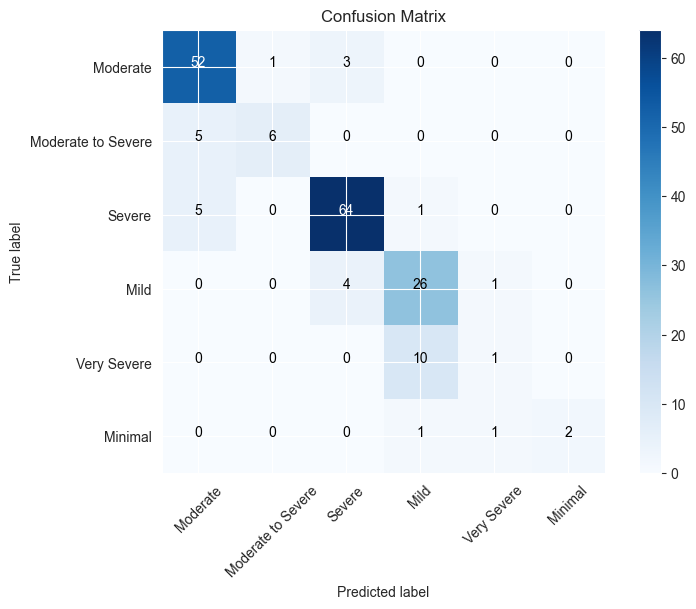

In [17]:
import itertools
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import accuracy_score, classification_report, confusion_matrix
from sklearn.model_selection import StratifiedKFold
from tensorflow.keras.models import Model
from tensorflow.keras.layers import Dense, SimpleRNN, Dropout, Input
from tensorflow.keras.regularizers import l2

# Load your dataset
data = pd.read_csv("B:/Projects/PycharmProjects/PPMI_Research_on_Parkinson's/src/mahbub/finalDatasetWithUPDRSScore.csv")

# Define non-feature, numerical, and categorical columns
non_feature_columns = ['Patient ID', 'Visit Date', 'UPDRS_SCORE', 'Visit']
numerical_features = [
    'Area', 'Circularity', 'ConvexArea', 'EquivDiameter', 'Extent',
    'FilledArea', 'Kurtosis', 'Major axis length', 'Mean',
    'Minor axis length', 'PA_ratio', 'Shannon_Entropy', 'Skewness',
    'Solidity', 'Standard Deviation', 'brightness', 'contrast',
    'correlation', 'dissimilarity', 'energy', 'gabor_energy',
    'gabor_entropy', 'homogeneity', 'lbp_energy', 'lbp_entropy',
    'DATSCAN_CAUDATE_R', 'DATSCAN_CAUDATE_L', 'DATSCAN_PUTAMEN_R',
    'DATSCAN_PUTAMEN_L', 'DATSCAN_PUTAMEN_R_ANT', 'DATSCAN_PUTAMEN_L_ANT'
]
categorical_features = [
    'NP1ANXS', 'NP1APAT', 'NP1COG', 'NP1DDS', 'NP1DPRS',
    'NP1HALL', 'NP1CNST', 'NP1FATG', 'NP1LTHD', 'NP1PAIN', 'NP1SLPD',
    'NP1SLPN', 'NP1URIN', 'NP2DRES', 'NP2EAT', 'NP2FREZ', 'NP2HOBB',
    'NP2HWRT', 'NP2HYGN', 'NP2RISE', 'NP2SALV', 'NP2SPCH', 'NP2SWAL',
    'NP2TRMR', 'NP2TURN', 'NP2WALK', 'NP3BRADY', 'NP3FACXP', 'NP3FRZGT',
    'NP3FTAPL', 'NP3FTAPR', 'NP3GAIT', 'NP3HMOVL', 'NP3HMOVR', 'NP3KTRML',
    'NP3KTRMR', 'NP3LGAGL', 'NP3LGAGR', 'NP3POSTR', 'NP3PRSPL', 'NP3PRSPR',
    'NP3PSTBL', 'NP3PTRML', 'NP3PTRMR', 'NP3RIGLL', 'NP3RIGLU', 'NP3RIGN',
    'NP3RIGRL', 'NP3RIGRU', 'NP3RISNG', 'NP3RTALJ', 'NP3RTALL', 'NP3RTALU',
    'NP3RTARL', 'NP3RTARU', 'NP3RTCON', 'NP3SPCH', 'NP3TTAPL', 'NP3TTAPR',
    'NHY'
]
target_column = "Disease_Severity"
class_lebels_u= data[target_column].unique()
# Scale numerical features
scaler = StandardScaler()
data[numerical_features] = scaler.fit_transform(data[numerical_features])

# One-hot encode the target variable (Disease_Severity)
data = pd.get_dummies(data, columns=[target_column], drop_first=False)

# Extract target columns after one-hot encoding
target_columns = list(data.filter(regex='Disease_Severity').columns)

# Separate features and target
X = data.drop(non_feature_columns + target_columns, axis=1)
y = data[target_columns]

# Convert X and y to numpy arrays
X = X.values
y = y.values

# Define function to create RNN model
def create_rnn_model(input_shape, units=100, dropout_rate=0.2, l2_rate=0.01):
    inputs = Input(shape=input_shape)
    x = SimpleRNN(units, kernel_regularizer=l2(l2_rate))(inputs)
    x = Dropout(dropout_rate)(x)
    outputs = Dense(y.shape[1], activation='softmax', kernel_regularizer=l2(l2_rate))(x)
    model = Model(inputs, outputs)
    model.compile(optimizer='adam', loss='categorical_crossentropy', metrics=['accuracy'])
    return model

# Define the best hyperparameters found
best_units = 100
best_dropout_rate = 0.2
best_l2_rate = 0.01

# Initialize Stratified KFold
n_splits = 5
skf = StratifiedKFold(n_splits=n_splits, shuffle=True, random_state=42)

# Initialize lists to store results
train_accuracies = []
test_accuracies = []
conf_matrices = []

# Define class labels based on target column
class_labels = [f"Disease_Severity_{i}" for i in range(y.shape[1])]

# Perform k-fold cross-validation
fold = 1
for train_index, test_index in skf.split(X, np.argmax(y, axis=1)):
    print(f"Processing fold {fold}...")
    X_train, X_test = X[train_index], X[test_index]
    y_train, y_test = y[train_index], y[test_index]

    # Reshape X to match RNN input shape (batch_size, timesteps, features)
    X_train = X_train.reshape((X_train.shape[0], 1, X_train.shape[1]))
    X_test = X_test.reshape((X_test.shape[0], 1, X_test.shape[1]))

    # Create and compile the RNN model with best hyperparameters
    input_shape = (1, X_train.shape[2])
    rnn_model = create_rnn_model(input_shape, units=best_units, dropout_rate=best_dropout_rate, l2_rate=best_l2_rate)

    # Fit the model
    history = rnn_model.fit(X_train, y_train, epochs=100, batch_size=32, verbose=0, validation_data=(X_test, y_test))

    # Evaluate on train set
    y_train_pred = rnn_model.predict(X_train)
    y_train_true = np.argmax(y_train, axis=1)
    y_train_pred_classes = np.argmax(y_train_pred, axis=1)
    train_accuracy = accuracy_score(y_train_true, y_train_pred_classes)
    train_accuracies.append(train_accuracy)

    # Evaluate on test set
    y_test_pred = rnn_model.predict(X_test)
    y_test_true = np.argmax(y_test, axis=1)
    y_test_pred_classes = np.argmax(y_test_pred, axis=1)
    test_accuracy = accuracy_score(y_test_true, y_test_pred_classes)
    test_accuracies.append(test_accuracy)

    # Calculate confusion matrix
    conf_matrix = confusion_matrix(y_test_true, y_test_pred_classes)
    conf_matrices.append(conf_matrix)

    print(f"Fold {fold} - Train Accuracy: {train_accuracy}, Test Accuracy: {test_accuracy}")
    fold += 1

# Find fold with best test accuracy
best_fold_idx = np.argmax(test_accuracies)
best_conf_matrix = conf_matrices[best_fold_idx]

# Print best test accuracy and corresponding confusion matrix
best_test_accuracy = test_accuracies[best_fold_idx]
print("\nBest Test Accuracy:")
print(f"Accuracy: {best_test_accuracy}")

# Plot confusion matrix
plt.figure(figsize=(8, 6))
plt.imshow(best_conf_matrix, interpolation='nearest', cmap=plt.cm.Blues)
plt.title('Confusion Matrix')
plt.colorbar()
tick_marks = np.arange(len(class_lebels_u))
plt.xticks(tick_marks, class_lebels_u, rotation=45)
plt.yticks(tick_marks, class_lebels_u)

thresh = best_conf_matrix.max() / 2.
for i, j in itertools.product(range(best_conf_matrix.shape[0]), range(best_conf_matrix.shape[1])):
    plt.text(j, i, format(best_conf_matrix[i, j], 'd'),
             horizontalalignment="center",
             color="white" if best_conf_matrix[i, j] > thresh else "black")

plt.tight_layout()
plt.ylabel('True label')
plt.xlabel('Predicted label')
plt.show()


Processing fold 1...
23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 625us/step
Fold 1 - Train Accuracy: 0.9355281207133059, Test Accuracy: 0.8306010928961749
Processing fold 2...
23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 830us/step
Fold 2 - Train Accuracy: 0.9245541838134431, Test Accuracy: 0.7978142076502732
Processing fold 3...
23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 842us/step
Fold 3 - Train Accuracy: 0.9287671232876712, Test Accuracy: 0.7802197802197802
Processing fold 4...
23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 626us/step
Fold 4 - Train Accuracy: 0.936986301369863, Test Accuracy: 0.8461538461538461
Processing fold 5...
23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 833us/step
Fold 5 - Train Accuracy: 0.9219178082191781, Test Accuracy: 0.8021978021978022

Best Test Accuracy:
Accuracy: 0.8461538461538461


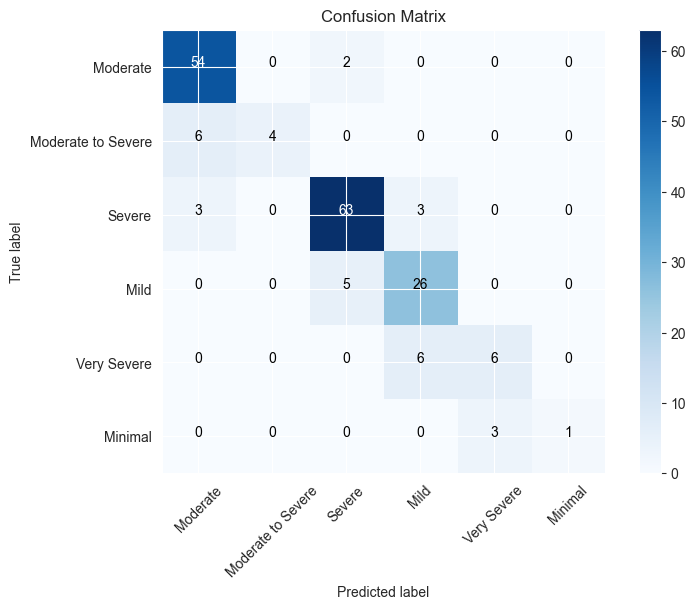

In [1]:
import itertools
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import accuracy_score, confusion_matrix
from sklearn.model_selection import StratifiedKFold
from tensorflow.keras.models import Model
from tensorflow.keras.layers import Dense, SimpleRNN, Dropout, Input
from tensorflow.keras.regularizers import l2
import shap

# Load your dataset
data = pd.read_csv("B:/Projects/PycharmProjects/PPMI_Research_on_Parkinson's/src/mahbub/finalDatasetWithUPDRSScore.csv")

# Define non-feature, numerical, and categorical columns
non_feature_columns = ['Patient ID', 'Visit Date', 'UPDRS_SCORE', 'Visit','Visit_int']
numerical_features = [
    'Area', 'Circularity', 'ConvexArea', 'EquivDiameter', 'Extent',
    'FilledArea', 'Kurtosis', 'Major axis length', 'Mean',
    'Minor axis length', 'PA_ratio', 'Shannon_Entropy', 'Skewness',
    'Solidity', 'Standard Deviation', 'brightness', 'contrast',
    'correlation', 'dissimilarity', 'energy', 'gabor_energy',
    'gabor_entropy', 'homogeneity', 'lbp_energy', 'lbp_entropy',
    'DATSCAN_CAUDATE_R', 'DATSCAN_CAUDATE_L', 'DATSCAN_PUTAMEN_R',
    'DATSCAN_PUTAMEN_L', 'DATSCAN_PUTAMEN_R_ANT', 'DATSCAN_PUTAMEN_L_ANT'
]
categorical_features = [
    'NP1ANXS', 'NP1APAT', 'NP1COG', 'NP1DDS', 'NP1DPRS',
    'NP1HALL', 'NP1CNST', 'NP1FATG', 'NP1LTHD', 'NP1PAIN', 'NP1SLPD',
    'NP1SLPN', 'NP1URIN', 'NP2DRES', 'NP2EAT', 'NP2FREZ', 'NP2HOBB',
    'NP2HWRT', 'NP2HYGN', 'NP2RISE', 'NP2SALV', 'NP2SPCH', 'NP2SWAL',
    'NP2TRMR', 'NP2TURN', 'NP2WALK', 'NP3BRADY', 'NP3FACXP', 'NP3FRZGT',
    'NP3FTAPL', 'NP3FTAPR', 'NP3GAIT', 'NP3HMOVL', 'NP3HMOVR', 'NP3KTRML',
    'NP3KTRMR', 'NP3LGAGL', 'NP3LGAGR', 'NP3POSTR', 'NP3PRSPL', 'NP3PRSPR',
    'NP3PSTBL', 'NP3PTRML', 'NP3PTRMR', 'NP3RIGLL', 'NP3RIGLU', 'NP3RIGN',
    'NP3RIGRL', 'NP3RIGRU', 'NP3RISNG', 'NP3RTALJ', 'NP3RTALL', 'NP3RTALU',
    'NP3RTARL', 'NP3RTARU', 'NP3RTCON', 'NP3SPCH', 'NP3TTAPL', 'NP3TTAPR',
    'NHY'
]
target_column = "Disease_Severity"
class_labels_u = data[target_column].unique()

# Scale numerical features
scaler = StandardScaler()
data[numerical_features] = scaler.fit_transform(data[numerical_features])

# One-hot encode the target variable (Disease_Severity)
data = pd.get_dummies(data, columns=[target_column], drop_first=False)

# Extract target columns after one-hot encoding
target_columns = list(data.filter(regex='Disease_Severity').columns)

# Separate features and target
X = data.drop(non_feature_columns + target_columns, axis=1)
y = data[target_columns]

# Convert X and y to numpy arrays
X = X.values
y = y.values

# Define function to create RNN model
def create_rnn_model(input_shape, units=100, dropout_rate=0.2, l2_rate=0.01):
    inputs = Input(shape=input_shape)
    x = SimpleRNN(units, kernel_regularizer=l2(l2_rate))(inputs)
    x = Dropout(dropout_rate)(x)
    outputs = Dense(y.shape[1], activation='softmax', kernel_regularizer=l2(l2_rate))(x)
    model = Model(inputs, outputs)
    model.compile(optimizer='adam', loss='categorical_crossentropy', metrics=['accuracy'])
    return model

# Define the best hyperparameters found
best_units = 100
best_dropout_rate = 0.2
best_l2_rate = 0.01

# Initialize Stratified KFold
n_splits = 5
skf = StratifiedKFold(n_splits=n_splits, shuffle=True, random_state=42)

# Initialize lists to store results
train_accuracies = []
test_accuracies = []
conf_matrices = []
best_model = None

# Perform k-fold cross-validation
fold = 1
for train_index, test_index in skf.split(X, np.argmax(y, axis=1)):
    print(f"Processing fold {fold}...")
    X_train, X_test = X[train_index], X[test_index]
    y_train, y_test = y[train_index], y[test_index]

    # Reshape X to match RNN input shape (batch_size, timesteps, features)
    X_train = X_train.reshape((X_train.shape[0], 1, X_train.shape[1]))
    X_test = X_test.reshape((X_test.shape[0], 1, X_test.shape[1]))

    # Create and compile the RNN model with best hyperparameters
    input_shape = (1, X_train.shape[2])
    rnn_model = create_rnn_model(input_shape, units=best_units, dropout_rate=best_dropout_rate, l2_rate=best_l2_rate)

    # Fit the model
    history = rnn_model.fit(X_train, y_train, epochs=100, batch_size=32, verbose=0, validation_data=(X_test, y_test))

    # Evaluate on train set
    y_train_pred = rnn_model.predict(X_train)
    y_train_true = np.argmax(y_train, axis=1)
    y_train_pred_classes = np.argmax(y_train_pred, axis=1)
    train_accuracy = accuracy_score(y_train_true, y_train_pred_classes)
    train_accuracies.append(train_accuracy)

    # Evaluate on test set
    y_test_pred = rnn_model.predict(X_test)
    y_test_true = np.argmax(y_test, axis=1)
    y_test_pred_classes = np.argmax(y_test_pred, axis=1)
    test_accuracy = accuracy_score(y_test_true, y_test_pred_classes)
    test_accuracies.append(test_accuracy)

    # Save the best model
    if best_model is None or test_accuracy > np.max(test_accuracies[:-1]):
        best_model = rnn_model

    # Calculate confusion matrix
    conf_matrix = confusion_matrix(y_test_true, y_test_pred_classes)
    conf_matrices.append(conf_matrix)

    print(f"Fold {fold} - Train Accuracy: {train_accuracy}, Test Accuracy: {test_accuracy}")
    fold += 1

# Find fold with best test accuracy
best_fold_idx = np.argmax(test_accuracies)
best_conf_matrix = conf_matrices[best_fold_idx]

# Print best test accuracy and corresponding confusion matrix
best_test_accuracy = test_accuracies[best_fold_idx]
print("\nBest Test Accuracy:")
print(f"Accuracy: {best_test_accuracy}")

# Plot confusion matrix
plt.figure(figsize=(8, 6))
plt.imshow(best_conf_matrix, interpolation='nearest', cmap=plt.cm.Blues)
plt.title('Confusion Matrix')
plt.colorbar()
tick_marks = np.arange(len(class_labels_u))
plt.xticks(tick_marks, class_labels_u, rotation=45)
plt.yticks(tick_marks, class_labels_u)

thresh = best_conf_matrix.max() / 2.
for i, j in itertools.product(range(best_conf_matrix.shape[0]), range(best_conf_matrix.shape[1])):
    plt.text(j, i, format(best_conf_matrix[i, j], 'd'),
             horizontalalignment="center",
             color="white" if best_conf_matrix[i, j] > thresh else "black")

plt.tight_layout()
plt.ylabel('True label')
plt.xlabel('Predicted label')
plt.show()



Intercept 0.13636957533591174
Prediction_local [0.13589491]
Right: 0.13692832



Explanation for instance 3:
1.00 < NP3RTARL <= 2.00: -0.0009
NP3FRZGT <= 0.00: -0.0007
NP3PRSPR <= 0.00: 0.0007
NP2SPCH <= 1.00: 0.0006
NP3RIGLL <= 0.00: -0.0005
NP3KTRML <= 0.00: -0.0005
NP1DPRS <= 0.00: 0.0004
NP2SWAL <= 0.00: 0.0004


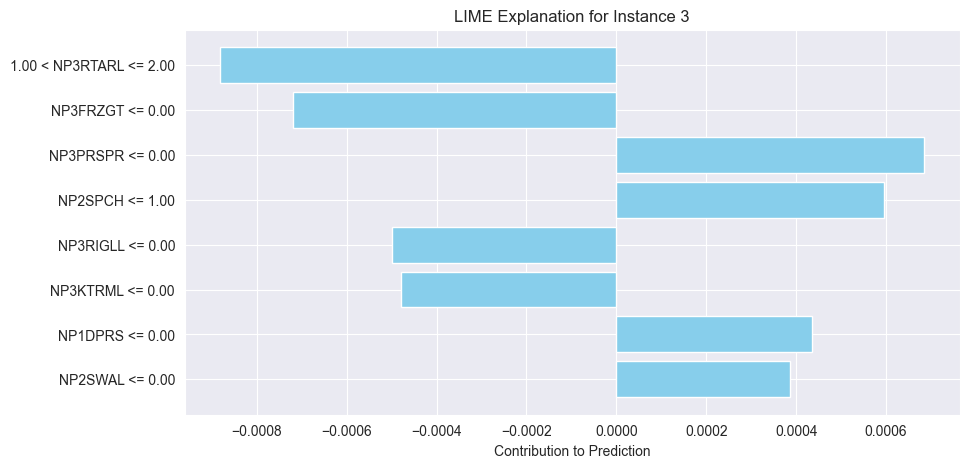


Probabilities for instance 3:
Class Moderate: 0.3335
Class Moderate to Severe: 0.1369
Class Severe: 0.1352
Class Mild: 0.1315
Class Very Severe: 0.1315
Class Minimal: 0.1315

Feature values for instance 3:
Area: -0.7832432889815975
Circularity: -0.11450242275709012
ConvexArea: -0.8333341166224987
EquivDiameter: -0.5642025477671091
Extent: 0.6644842361871847
FilledArea: -0.7821817560771176
Kurtosis: 0.8434012141273046
Major axis length: -0.9176893607235682
Mean: -0.8666982363978584
Minor axis length: -0.048767229702244806
PA_ratio: 0.0738772681318353
Shannon_Entropy: -0.4143468251145152
Skewness: 0.9015719419609284
Solidity: 0.5506073911201651
Standard Deviation: -0.9688001528224065
brightness: -0.8666982363978584
contrast: -0.5053438357764576
correlation: -0.007180177675031334
dissimilarity: -0.4502014522583199
energy: 0.8331209504391429
gabor_energy: -0.5258729876070557
gabor_entropy: -0.7202723162829386
homogeneity: 0.34800924106090003
lbp_energy: 0.5032653533872407
lbp_entropy: -0.


Explanation for instance 4:
1.00 < NP3RTARL <= 2.00: -0.0008
NP3PRSPR <= 0.00: 0.0008
NP3RIGLL <= 0.00: -0.0006
NP2SPCH <= 1.00: 0.0006
NP2SWAL <= 0.00: -0.0005
NP3FRZGT <= 0.00: -0.0005
Skewness > 0.60: -0.0004
NP3PTRMR <= 0.00: -0.0004


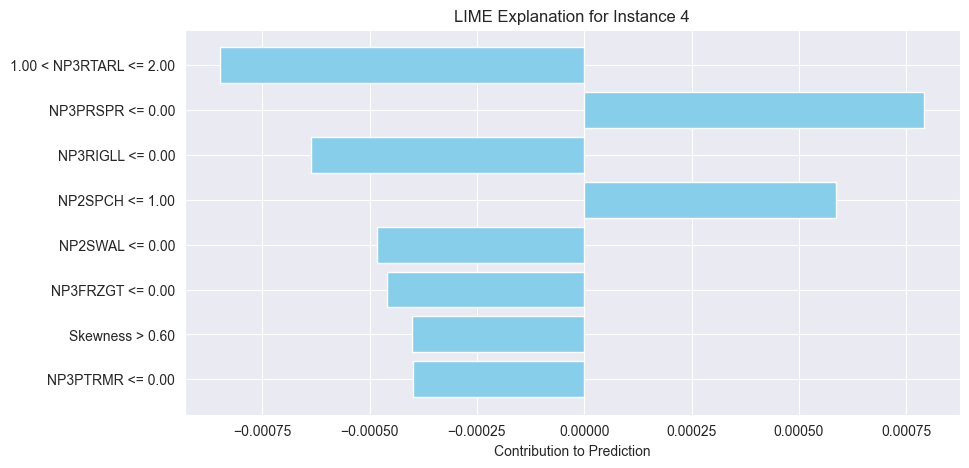


Probabilities for instance 4:
Class Moderate: 0.1480
Class Moderate to Severe: 0.1359
Class Severe: 0.2806
Class Mild: 0.1626
Class Very Severe: 0.1368
Class Minimal: 0.1361

Feature values for instance 4:
Area: -0.9294629817630791
Circularity: 0.033226848411993005
ConvexArea: -0.9879726304129621
EquivDiameter: -0.7338116798855473
Extent: 1.1108341510368478
FilledArea: -0.9309071149310487
Kurtosis: 1.0855488394731045
Major axis length: -1.0260208440689094
Mean: -0.9651435794503085
Minor axis length: -0.30205682732964156
PA_ratio: -0.35893716631664113
Shannon_Entropy: -0.7783797108256407
Skewness: 1.1470215723140007
Solidity: 1.0383350444780637
Standard Deviation: -1.0202637601033573
brightness: -0.9651435794503085
contrast: -0.627534657605298
correlation: 0.252611117396566
dissimilarity: -0.7180221482874997
energy: 1.0310380856121515
gabor_energy: -0.4337344716843758
gabor_entropy: -0.8247554901741436
homogeneity: 0.7404583781889845
lbp_energy: 0.8795424338583989
lbp_entropy: -0.97081


Explanation for instance 9:
NP3RISNG <= 0.00: 0.0009
1.00 < NP3RTARL <= 2.00: -0.0009
NP3FRZGT <= 0.00: -0.0007
NP2SPCH <= 1.00: 0.0006
NHY <= -0.68: 0.0006
NP2HYGN <= 0.00: -0.0005
Minor axis length <= -0.45: -0.0004
NP3TTAPR <= -0.68: 0.0004


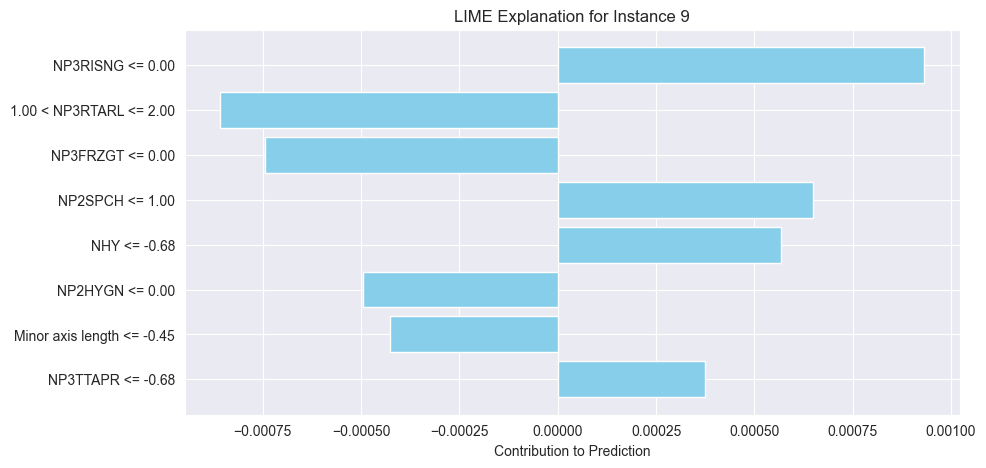


Probabilities for instance 9:
Class Moderate: 0.3079
Class Moderate to Severe: 0.1363
Class Severe: 0.1545
Class Mild: 0.1339
Class Very Severe: 0.1337
Class Minimal: 0.1337

Feature values for instance 9:
Area: -1.3339104012664145
Circularity: 1.9822419340162
ConvexArea: -1.306765874347931
EquivDiameter: -1.617754629191082
Extent: -0.3371272711948272
FilledArea: -1.3332581642917074
Kurtosis: -0.27950941111739325
Major axis length: -1.4473463411424876
Mean: -0.05920847928259903
Minor axis length: -1.4172488846910254
PA_ratio: 1.248969557817688
Shannon_Entropy: -0.5584174694090449
Skewness: -0.1867237755837944
Solidity: 1.8092778695574938
Standard Deviation: 0.10202751567175837
brightness: -0.05920847928259903
contrast: -0.2793457407408239
correlation: 0.4512192106741732
dissimilarity: -0.42862160212089945
energy: 0.3154364774723728
gabor_energy: 0.06992290761307017
gabor_entropy: -0.12447681459985882
homogeneity: 0.5758836998154138
lbp_energy: 0.586163753725685
lbp_entropy: -0.6622033


Explanation for instance 25:
NP3FRZGT > 1.00: 0.0010
1.00 < NP3RTARL <= 2.00: -0.0008
1.00 < NP3RISNG <= 3.00: -0.0006
1.00 < NP2SPCH <= 2.00: -0.0005
NP2HYGN > 1.00: 0.0005
NP2WALK > 1.00: -0.0005
NP3KTRML > 1.00: 0.0005
DATSCAN_CAUDATE_R > 1.00: -0.0004


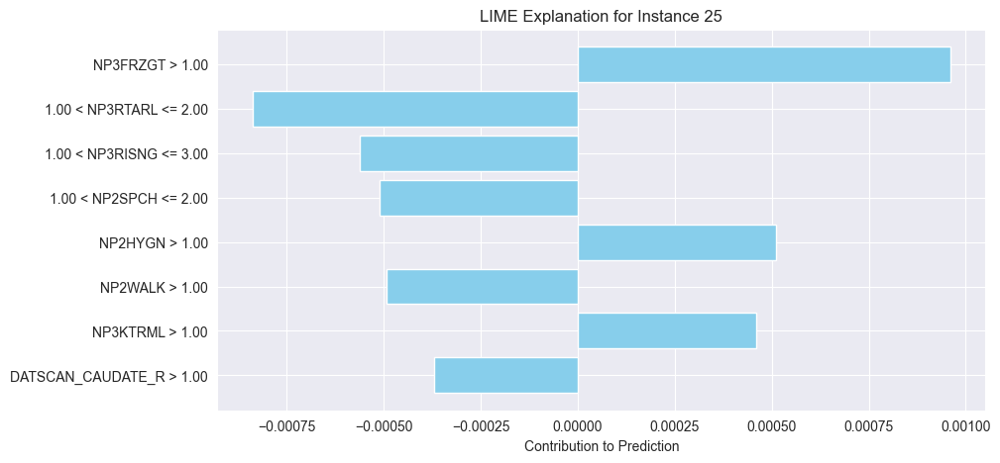


Probabilities for instance 25:
Class Moderate: 0.1362
Class Moderate to Severe: 0.1362
Class Severe: 0.1363
Class Mild: 0.1584
Class Very Severe: 0.2763
Class Minimal: 0.1567

Feature values for instance 25:
Area: 1.425517647169438
Circularity: -0.27800545728373366
ConvexArea: 2.08011496039895
EquivDiameter: 1.351277935005531
Extent: -2.2402433106753334
FilledArea: 1.4174616398717337
Kurtosis: -0.7068869326294474
Major axis length: 2.079769498609174
Mean: 0.29315741240046195
Minor axis length: 1.4021540986418584
PA_ratio: -0.4699027038834233
Shannon_Entropy: 0.7616968001906937
Skewness: -0.6908031066896594
Solidity: -2.2785308944269946
Standard Deviation: 0.2997455542769162
brightness: 0.29315741240046195
contrast: 0.07700879607351291
correlation: -0.06592851582953788
dissimilarity: 0.2820314061374882
energy: -0.2320583993107655
gabor_energy: 0.03972749821785371
gabor_entropy: 0.2315135687314165
homogeneity: -0.7029089242316231
lbp_energy: -0.6331046281253111
lbp_entropy: 0.7108630927


Explanation for instance 88:
1.00 < NP3RTARL <= 2.00: -0.0008
NP3FRZGT <= 0.00: -0.0006
NP2SPCH <= 1.00: 0.0006
NP3SPCH > 0.43: 0.0004
NP3KTRML <= 0.00: -0.0004
0.00 < NP2HYGN <= 1.00: 0.0004
1.00 < NP1DPRS <= 2.00: -0.0004
NP1DDS > 1.00: -0.0004


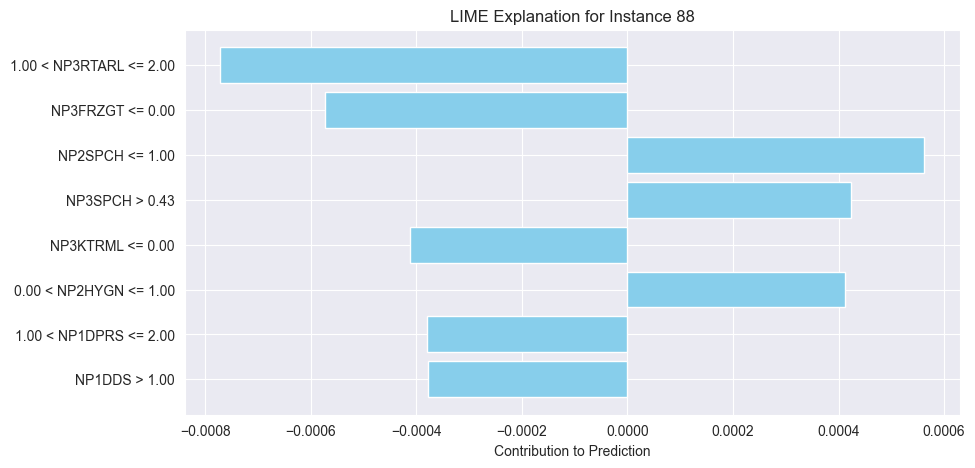


Probabilities for instance 88:
Class Moderate: 0.1370
Class Moderate to Severe: 0.1351
Class Severe: 0.2884
Class Mild: 0.1669
Class Very Severe: 0.1368
Class Minimal: 0.1357

Feature values for instance 88:
Area: 0.06736165460298331
Circularity: -0.24980351635110543
ConvexArea: 0.08170955103019123
EquivDiameter: 0.20652282354232318
Extent: 0.17094312777847417
FilledArea: 0.06821026430142982
Kurtosis: -0.2469244145547706
Major axis length: 0.041732612478057506
Mean: -0.06805187020031345
Minor axis length: 0.38992593983538826
PA_ratio: -0.04994600301118056
Shannon_Entropy: -0.2998320525726275
Skewness: -0.16202141754864685
Solidity: -0.19688295992176022
Standard Deviation: 0.06333343181663807
brightness: -0.06805187020031345
contrast: -0.032258460577819247
correlation: 0.09057022588627076
dissimilarity: -0.16065868762837807
energy: 0.24778765277735898
gabor_energy: 0.030264130632602814
gabor_entropy: -0.09841710226371642
homogeneity: 0.30036392264337936
lbp_energy: 0.16457419168433002



Explanation for instance 55:
NP3PRSPR > 1.00: -0.0010
1.00 < NP3RTARL <= 2.00: -0.0008
NP3FRZGT <= 0.00: -0.0007
NP3TTAPR > 0.52: -0.0005
1.00 < NP2SPCH <= 2.00: -0.0005
NP2HYGN <= 0.00: -0.0004
NP3POSTR > 1.00: 0.0004
NP3RIGLL > 0.00: 0.0004


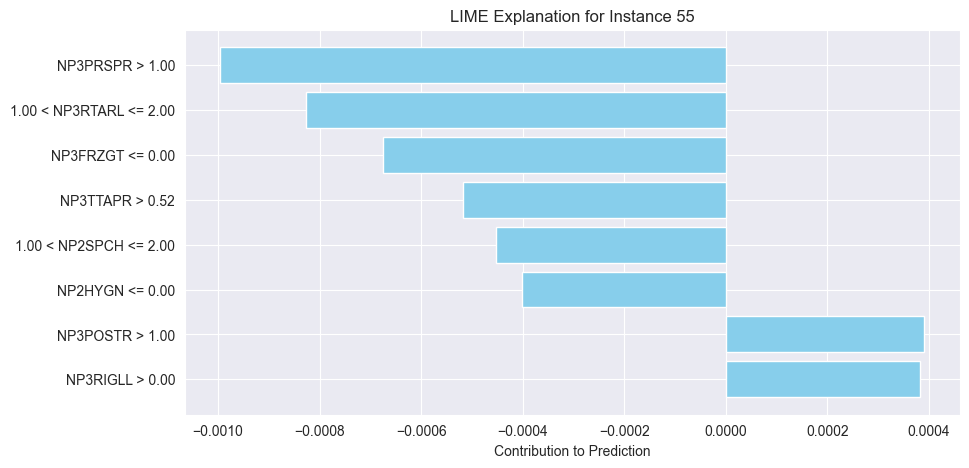


Probabilities for instance 55:
Class Moderate: 0.1379
Class Moderate to Severe: 0.1377
Class Severe: 0.2205
Class Mild: 0.2202
Class Very Severe: 0.1440
Class Minimal: 0.1397

Feature values for instance 55:
Area: -0.854478523973287
Circularity: -0.09387988254466127
ConvexArea: -0.8942973765811579
EquivDiameter: -0.6889528737827189
Extent: 0.5302049408426001
FilledArea: -0.8535139815059096
Kurtosis: 1.1702817246742965
Major axis length: -1.0337138077508659
Mean: -0.8133985919646357
Minor axis length: 0.043688111620498175
PA_ratio: 0.20564536042252976
Shannon_Entropy: 0.2985639847060396
Skewness: 1.1028659623774681
Solidity: 0.4921146091502789
Standard Deviation: -1.0091134359458394
brightness: -0.8133985919646357
contrast: -0.3350514483245684
correlation: -0.22261719626545468
dissimilarity: -0.18413229564418673
energy: 0.3445183255763757
gabor_energy: -0.4889351463060758
gabor_entropy: -0.5945344507275749
homogeneity: -0.3152946348141026
lbp_energy: -0.20680728240140395
lbp_entropy: 0

In [2]:
import tensorflow as tf  # Ensure TensorFlow is imported
import lime
import lime.lime_tabular
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np

# Reshape X_train and X_test to remove the middle dimension
X_train_flat = X_train.reshape((X_train.shape[0], X_train.shape[2]))
X_test_flat = X_test.reshape((X_test.shape[0], X_test.shape[2]))

# Convert data back to DataFrame for LIME
X_train_df = pd.DataFrame(X_train_flat, columns=numerical_features + categorical_features)
X_test_df = pd.DataFrame(X_test_flat, columns=numerical_features + categorical_features)

# Define the prediction function for LIME
def predict_proba(X):
    X = X.reshape((X.shape[0], 1, X.shape[1]))  # Reshape for RNN input shape
    X = tf.convert_to_tensor(X, dtype=tf.float32)
    preds = best_model(X)  # Use best_model directly
    probs = tf.nn.softmax(preds, axis=1).numpy()
    return probs

# Initialize LIME explainer
explainer = lime.lime_tabular.LimeTabularExplainer(
    training_data=X_train_df.values,
    feature_names=X_train_df.columns.tolist(),
    class_names=class_labels_u,  # Ensure this list contains all class names
    verbose=True,
    mode='classification'
)

# Choose instances to explain
instances_to_explain = [3, 4, 9, 25, 88, 55]

# Function to visualize LIME explanation
def visualize_lime_explanation(exp, instance_index, instance, probabilities):
    # Show the explanation in notebook
    exp.show_in_notebook(show_table=True)
    
    # Get the explanation as a list of (feature, contribution) tuples
    explanation_list = exp.as_list()

    # Print the feature contributions
    print(f"\nExplanation for instance {instance_index}:")
    for feature, contribution in explanation_list:
        print(f"{feature}: {contribution:.4f}")

    # Visualize the explanation with a bar plot
    feature_names, contributions = zip(*explanation_list)
    plt.figure(figsize=(10, 5))
    plt.barh(feature_names, contributions, color='skyblue')
    plt.xlabel('Contribution to Prediction')
    plt.title(f'LIME Explanation for Instance {instance_index}')
    plt.gca().invert_yaxis()  # Invert y-axis to have the most important feature on top
    plt.show()
    
    # Show probabilities of each class
    print(f"\nProbabilities for instance {instance_index}:")
    for class_idx, prob in enumerate(probabilities):
        print(f"Class {class_labels_u[class_idx]}: {prob:.4f}")
    
    # Show feature values of the instance
    print(f"\nFeature values for instance {instance_index}:")
    for feature_idx, value in enumerate(instance):
        print(f"{X_test_df.columns[feature_idx]}: {value}")

# Iterate over instances to explain
for instance_index in instances_to_explain:
    instance = X_test_df.values[instance_index]
    probabilities = predict_proba(instance.reshape(1, -1))[0]
    
    exp = explainer.explain_instance(
        data_row=instance,
        predict_fn=predict_proba,
        num_features=8  # Adjust the number of features to show in the explanation
    )
    visualize_lime_explanation(exp, instance_index, instance, probabilities)


Processing fold 1...
23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step 
Fold 1 - Train Accuracy: 0.9204389574759945, Test Accuracy: 0.819672131147541
Processing fold 2...
23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 835us/step
Fold 2 - Train Accuracy: 0.9149519890260631, Test Accuracy: 0.7759562841530054
Processing fold 3...
23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step 
Fold 3 - Train Accuracy: 0.915068493150685, Test Accuracy: 0.7967032967032966
Processing fold 4...
23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 826us/step
Fold 4 - Train Accuracy: 0.8890410958904109, Test Accuracy: 0.7802197802197802
Processing fold 5...
23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step 
Fold 5 - Train Accuracy: 0.915068493150685, Test Accuracy: 0.7472527472527473

Best Test Accuracy:
Accuracy: 0.819672131147541


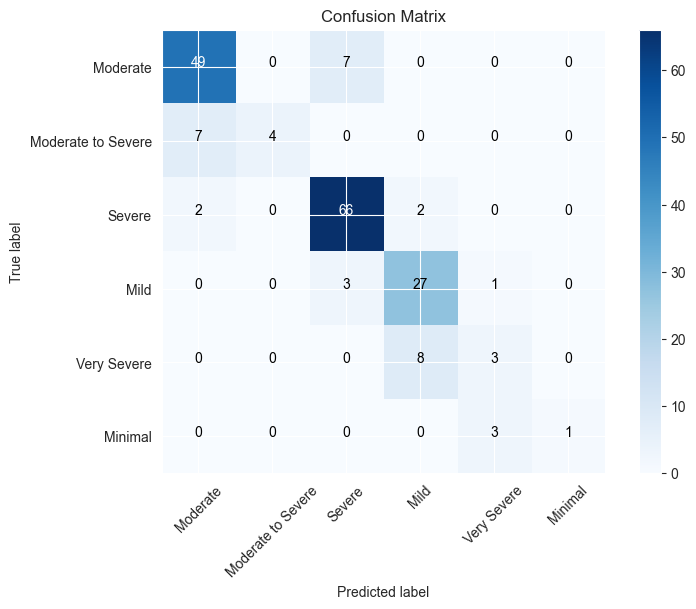

In [1]:
import itertools
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import accuracy_score, confusion_matrix
from sklearn.model_selection import StratifiedKFold
from tensorflow.keras.models import Model
from tensorflow.keras.layers import Dense, LSTM, Dropout, Input
from tensorflow.keras.regularizers import l2
import shap

# Load your dataset
data = pd.read_csv("B:/Projects/PycharmProjects/PPMI_Research_on_Parkinson's/src/mahbub/finalDatasetWithUPDRSScore.csv")

# Define non-feature, numerical, and categorical columns
non_feature_columns = ['Patient ID', 'Visit Date', 'UPDRS_SCORE', 'Visit','Visit_int']
numerical_features = [
    'Area', 'Circularity', 'ConvexArea', 'EquivDiameter', 'Extent',
    'FilledArea', 'Kurtosis', 'Major axis length', 'Mean',
    'Minor axis length', 'PA_ratio', 'Shannon_Entropy', 'Skewness',
    'Solidity', 'Standard Deviation', 'brightness', 'contrast',
    'correlation', 'dissimilarity', 'energy', 'gabor_energy',
    'gabor_entropy', 'homogeneity', 'lbp_energy', 'lbp_entropy',
    'DATSCAN_CAUDATE_R', 'DATSCAN_CAUDATE_L', 'DATSCAN_PUTAMEN_R',
    'DATSCAN_PUTAMEN_L', 'DATSCAN_PUTAMEN_R_ANT', 'DATSCAN_PUTAMEN_L_ANT'
]
categorical_features = [
    'NP1ANXS', 'NP1APAT', 'NP1COG', 'NP1DDS', 'NP1DPRS',
    'NP1HALL', 'NP1CNST', 'NP1FATG', 'NP1LTHD', 'NP1PAIN', 'NP1SLPD',
    'NP1SLPN', 'NP1URIN', 'NP2DRES', 'NP2EAT', 'NP2FREZ', 'NP2HOBB',
    'NP2HWRT', 'NP2HYGN', 'NP2RISE', 'NP2SALV', 'NP2SPCH', 'NP2SWAL',
    'NP2TRMR', 'NP2TURN', 'NP2WALK', 'NP3BRADY', 'NP3FACXP', 'NP3FRZGT',
    'NP3FTAPL', 'NP3FTAPR', 'NP3GAIT', 'NP3HMOVL', 'NP3HMOVR', 'NP3KTRML',
    'NP3KTRMR', 'NP3LGAGL', 'NP3LGAGR', 'NP3POSTR', 'NP3PRSPL', 'NP3PRSPR',
    'NP3PSTBL', 'NP3PTRML', 'NP3PTRMR', 'NP3RIGLL', 'NP3RIGLU', 'NP3RIGN',
    'NP3RIGRL', 'NP3RIGRU', 'NP3RISNG', 'NP3RTALJ', 'NP3RTALL', 'NP3RTALU',
    'NP3RTARL', 'NP3RTARU', 'NP3RTCON', 'NP3SPCH', 'NP3TTAPL', 'NP3TTAPR',
    'NHY'
]
target_column = "Disease_Severity"
class_labels_u = data[target_column].unique()

# Scale numerical features
scaler = StandardScaler()
data[numerical_features] = scaler.fit_transform(data[numerical_features])

# One-hot encode the target variable (Disease_Severity)
data = pd.get_dummies(data, columns=[target_column], drop_first=False)

# Extract target columns after one-hot encoding
target_columns = list(data.filter(regex='Disease_Severity').columns)

# Separate features and target
X = data.drop(non_feature_columns + target_columns, axis=1)
y = data[target_columns]

# Convert X and y to numpy arrays
X = X.values
y = y.values

# Define function to create LSTM model
def create_lstm_model(input_shape, units=100, dropout_rate=0.2, l2_rate=0.01):
    inputs = Input(shape=input_shape)
    x = LSTM(units, kernel_regularizer=l2(l2_rate))(inputs)
    x = Dropout(dropout_rate)(x)
    outputs = Dense(y.shape[1], activation='softmax', kernel_regularizer=l2(l2_rate))(x)
    model = Model(inputs, outputs)
    model.compile(optimizer='adam', loss='categorical_crossentropy', metrics=['accuracy'])
    return model

# Define the best hyperparameters found
best_units = 100
best_dropout_rate = 0.2
best_l2_rate = 0.01

# Initialize Stratified KFold
n_splits = 5
skf = StratifiedKFold(n_splits=n_splits, shuffle=True, random_state=42)

# Initialize lists to store results
train_accuracies = []
test_accuracies = []
conf_matrices = []
best_model = None  # Global variable to store the best model

# Perform k-fold cross-validation
fold = 1
for train_index, test_index in skf.split(X, np.argmax(y, axis=1)):
    print(f"Processing fold {fold}...")
    X_train, X_test = X[train_index], X[test_index]
    y_train, y_test = y[train_index], y[test_index]

    # Reshape X to match LSTM input shape (batch_size, timesteps, features)
    X_train = X_train.reshape((X_train.shape[0], 1, X_train.shape[1]))
    X_test = X_test.reshape((X_test.shape[0], 1, X_test.shape[1]))

    # Create and compile the LSTM model with best hyperparameters
    input_shape = (1, X_train.shape[2])
    lstm_model = create_lstm_model(input_shape, units=best_units, dropout_rate=best_dropout_rate, l2_rate=best_l2_rate)

    # Fit the model
    history = lstm_model.fit(X_train, y_train, epochs=100, batch_size=32, verbose=0, validation_data=(X_test, y_test))

    # Evaluate on train set
    y_train_pred = lstm_model.predict(X_train)
    y_train_true = np.argmax(y_train, axis=1)
    y_train_pred_classes = np.argmax(y_train_pred, axis=1)
    train_accuracy = accuracy_score(y_train_true, y_train_pred_classes)
    train_accuracies.append(train_accuracy)

    # Evaluate on test set
    y_test_pred = lstm_model.predict(X_test)
    y_test_true = np.argmax(y_test, axis=1)
    y_test_pred_classes = np.argmax(y_test_pred, axis=1)
    test_accuracy = accuracy_score(y_test_true, y_test_pred_classes)
    test_accuracies.append(test_accuracy)

    # Save the best model
    if best_model is None or test_accuracy > np.max(test_accuracies[:-1]):
        best_model = lstm_model

    # Calculate confusion matrix
    conf_matrix = confusion_matrix(y_test_true, y_test_pred_classes)
    conf_matrices.append(conf_matrix)

    print(f"Fold {fold} - Train Accuracy: {train_accuracy}, Test Accuracy: {test_accuracy}")
    fold += 1

# Find fold with best test accuracy
best_fold_idx = np.argmax(test_accuracies)
best_conf_matrix = conf_matrices[best_fold_idx]

# Print best test accuracy and corresponding confusion matrix
best_test_accuracy = test_accuracies[best_fold_idx]
print("\nBest Test Accuracy:")
print(f"Accuracy: {best_test_accuracy}")

# Plot confusion matrix
plt.figure(figsize=(8, 6))
plt.imshow(best_conf_matrix, interpolation='nearest', cmap=plt.cm.Blues)
plt.title('Confusion Matrix')
plt.colorbar()
tick_marks = np.arange(len(class_labels_u))
plt.xticks(tick_marks, class_labels_u, rotation=45)
plt.yticks(tick_marks, class_labels_u)

thresh = best_conf_matrix.max() / 2.
for i, j in itertools.product(range(best_conf_matrix.shape[0]), range(best_conf_matrix.shape[1])):
    plt.text(j, i, format(best_conf_matrix[i, j], 'd'),
             horizontalalignment="center",
             color="white" if best_conf_matrix[i, j] > thresh else "black")

plt.tight_layout()
plt.ylabel('True label')
plt.xlabel('Predicted label')
plt.show()


Intercept 0.1367316207385829
Prediction_local [0.1380752]
Right: 0.14219925



Explanation for instance 3:
1.00 < NP3RTARL <= 2.00: -0.0011
NP2SPCH <= 1.00: 0.0009
NP3PRSPR <= 0.00: 0.0009
NP3KTRMR <= 0.00: -0.0008
NP3BRADY <= 0.00: 0.0008
NP2SALV <= 1.00: 0.0008
NP3RIGLL <= 0.00: -0.0008
NP1SLPN <= 0.00: 0.0006


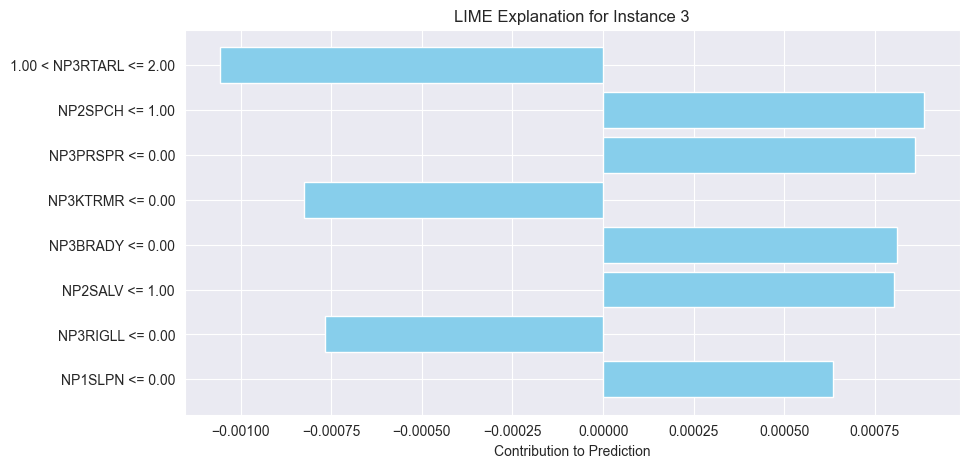


Probabilities for instance 3:
Class Moderate: 0.3094
Class Moderate to Severe: 0.1422
Class Severe: 0.1470
Class Mild: 0.1340
Class Very Severe: 0.1337
Class Minimal: 0.1337

Feature values for instance 3:
Area: -0.7832432889815975
Circularity: -0.11450242275709012
ConvexArea: -0.8333341166224987
EquivDiameter: -0.5642025477671091
Extent: 0.6644842361871847
FilledArea: -0.7821817560771176
Kurtosis: 0.8434012141273046
Major axis length: -0.9176893607235682
Mean: -0.8666982363978584
Minor axis length: -0.048767229702244806
PA_ratio: 0.0738772681318353
Shannon_Entropy: -0.4143468251145152
Skewness: 0.9015719419609284
Solidity: 0.5506073911201651
Standard Deviation: -0.9688001528224065
brightness: -0.8666982363978584
contrast: -0.5053438357764576
correlation: -0.007180177675031334
dissimilarity: -0.4502014522583199
energy: 0.8331209504391429
gabor_energy: -0.5258729876070557
gabor_entropy: -0.7202723162829386
homogeneity: 0.34800924106090003
lbp_energy: 0.5032653533872407
lbp_entropy: -0.


Explanation for instance 9:
NP3RISNG <= 0.00: 0.0013
NP2SPCH <= 1.00: 0.0010
NP3BRADY <= 0.00: 0.0010
NP2SALV <= 1.00: 0.0009
1.00 < NP3RTARL <= 2.00: -0.0009
NP3RIGLL <= 0.00: -0.0008
NP1APAT <= 0.00: 0.0008
NP3KTRMR <= 0.00: -0.0007


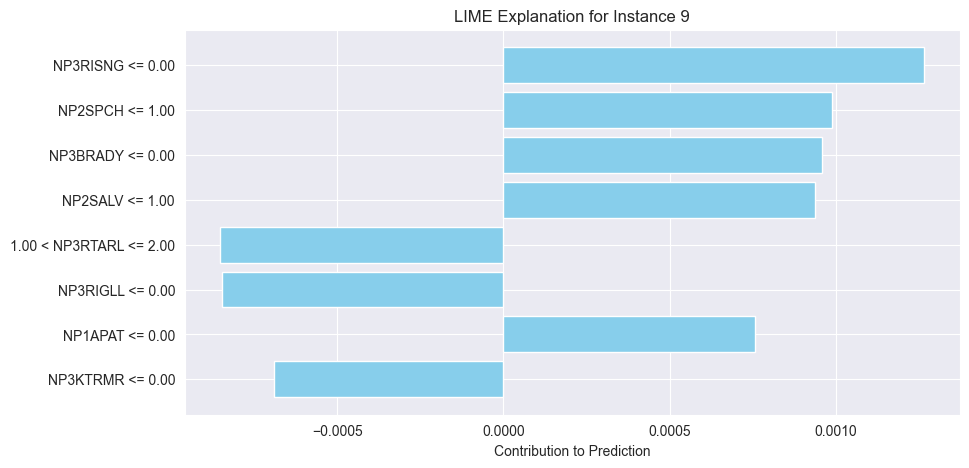


Probabilities for instance 9:
Class Moderate: 0.2977
Class Moderate to Severe: 0.1423
Class Severe: 0.1555
Class Mild: 0.1352
Class Very Severe: 0.1346
Class Minimal: 0.1347

Feature values for instance 9:
Area: -1.3339104012664145
Circularity: 1.9822419340162
ConvexArea: -1.306765874347931
EquivDiameter: -1.617754629191082
Extent: -0.3371272711948272
FilledArea: -1.3332581642917074
Kurtosis: -0.27950941111739325
Major axis length: -1.4473463411424876
Mean: -0.05920847928259903
Minor axis length: -1.4172488846910254
PA_ratio: 1.248969557817688
Shannon_Entropy: -0.5584174694090449
Skewness: -0.1867237755837944
Solidity: 1.8092778695574938
Standard Deviation: 0.10202751567175837
brightness: -0.05920847928259903
contrast: -0.2793457407408239
correlation: 0.4512192106741732
dissimilarity: -0.42862160212089945
energy: 0.3154364774723728
gabor_energy: 0.06992290761307017
gabor_entropy: -0.12447681459985882
homogeneity: 0.5758836998154138
lbp_energy: 0.586163753725685
lbp_entropy: -0.6622033

In [3]:
import tensorflow as tf  # Ensure TensorFlow is imported
import lime
import lime.lime_tabular
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np

# Reshape X_train and X_test to remove the middle dimension
X_train_flat = X_train.reshape((X_train.shape[0], X_train.shape[2]))
X_test_flat = X_test.reshape((X_test.shape[0], X_test.shape[2]))

# Convert data back to DataFrame for LIME
X_train_df = pd.DataFrame(X_train_flat, columns=numerical_features + categorical_features)
X_test_df = pd.DataFrame(X_test_flat, columns=numerical_features + categorical_features)

# Define the prediction function for LIME
def predict_proba(X):
    X = X.reshape((X.shape[0], 1, X.shape[1]))  # Reshape for RNN input shape
    X = tf.convert_to_tensor(X, dtype=tf.float32)
    preds = best_model(X)  # Use best_model directly
    probs = tf.nn.softmax(preds, axis=1).numpy()
    return probs

# Initialize LIME explainer
explainer = lime.lime_tabular.LimeTabularExplainer(
    training_data=X_train_df.values,
    feature_names=X_train_df.columns.tolist(),
    class_names=class_labels_u,  # Ensure this list contains all class names
    verbose=True,
    mode='classification'
)

# Choose instances to explain
instances_to_explain = [3,  9, ]

# Function to visualize LIME explanation
def visualize_lime_explanation(exp, instance_index, instance, probabilities):
    # Show the explanation in notebook
    exp.show_in_notebook(show_table=True)
    
    # Get the explanation as a list of (feature, contribution) tuples
    explanation_list = exp.as_list()

    # Print the feature contributions
    print(f"\nExplanation for instance {instance_index}:")
    for feature, contribution in explanation_list:
        print(f"{feature}: {contribution:.4f}")

    # Visualize the explanation with a bar plot
    feature_names, contributions = zip(*explanation_list)
    plt.figure(figsize=(10, 5))
    plt.barh(feature_names, contributions, color='skyblue')
    plt.xlabel('Contribution to Prediction')
    plt.title(f'LIME Explanation for Instance {instance_index}')
    plt.gca().invert_yaxis()  # Invert y-axis to have the most important feature on top
    plt.show()
    
    # Show probabilities of each class
    print(f"\nProbabilities for instance {instance_index}:")
    for class_idx, prob in enumerate(probabilities):
        print(f"Class {class_labels_u[class_idx]}: {prob:.4f}")
    
    # Show feature values of the instance
    print(f"\nFeature values for instance {instance_index}:")
    for feature_idx, value in enumerate(instance):
        print(f"{X_test_df.columns[feature_idx]}: {value}")

# Iterate over instances to explain
for instance_index in instances_to_explain:
    instance = X_test_df.values[instance_index]
    probabilities = predict_proba(instance.reshape(1, -1))[0]
    
    exp = explainer.explain_instance(
        data_row=instance,
        predict_fn=predict_proba,
        num_features=8  # Adjust the number of features to show in the explanation
    )
    visualize_lime_explanation(exp, instance_index, instance, probabilities)
